# CNN - Imagens Individuais - 1000 arquivos por amostra

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torchvision.models import ResNet50_Weights, EfficientNet_B0_Weights
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
from sklearn.utils import resample
from sklearn.metrics import f1_score, roc_auc_score, balanced_accuracy_score, confusion_matrix
import numpy as np
import os
from collections import defaultdict, Counter
from tqdm import tqdm

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import os

# Diretório para salvar os logs do TensorBoard
log_dir = "logs/undersampling_resnet50_ajusted"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# Inicializar o SummaryWriter
writer = SummaryWriter(log_dir=log_dir)


In [ ]:
# Transformações a serem aplicadas nas imagens
transform = transforms.Compose([
    transforms.Resize((32, 32)),  # Redimensionar as imagens para 224x224
    transforms.ToTensor(),  # Converter as imagens em tensores
])

# Carregar o dataset usando ImageFolder (assume que as pastas c1 e c2 estão dentro de data_dir)
data_dir = r'E:\dataset2'
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Definir parâmetros
batch_size = 128
num_epochs = 50
k_folds = 5  # Número de folds para validação cruzada


Label: c2


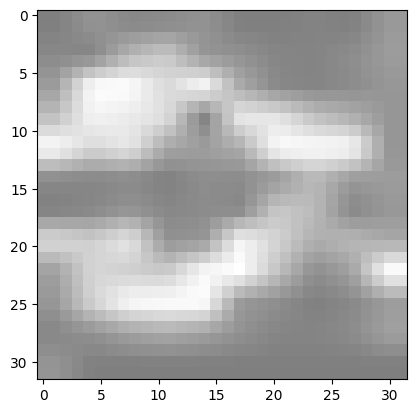

Label: c2


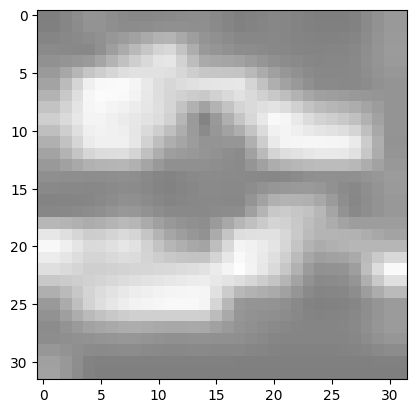

Label: c2


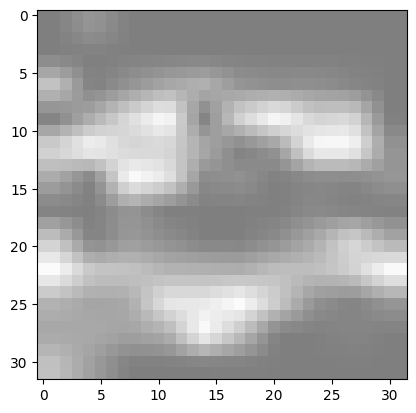

Label: c2


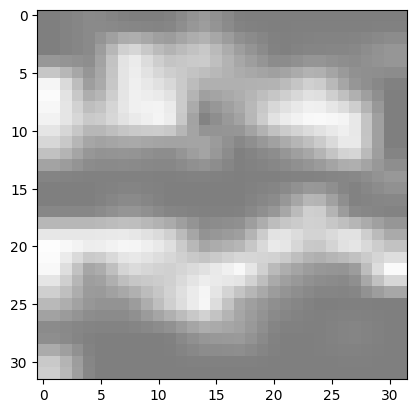

Tamanho do dataset: 140385 imagens


In [ ]:
# Carregar algumas amostras do DataLoader
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# Obter um batch de imagens
images, labels = next(iter(dataloader))

# Função para exibir imagens
def imshow(img):
    img = img / 2 + 0.5  # Desnormalizar
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)), interpolation='nearest')
    plt.show()

# Mostrar as imagens
for i in range(len(images)):
    print(f'Label: {dataset.classes[labels[i]]}')
    imshow(images[i])

# Verificar tamanho do dataset
print(f'Tamanho do dataset: {len(dataset)} imagens')

In [ ]:
# Verificar as classes atribuídas
print("Classes:", dataset.classes)

# Verificar alguns exemplos de labels
for idx, (path, label) in enumerate(dataset.imgs[50000:50100]):
    print(f"Path: {path}, Label: {label}")

Classes: ['c1', 'c2']
Path: E:\dataset2\c2\CE_individual_16_4_1965.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1966.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1967.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1968.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1969.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1970.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1971.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1972.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1973.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1974.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1975.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1976.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1977.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1978.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1979.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1980.png, Label: 1
Path: E:\dataset2\c2\CE_individual

In [ ]:
print(torch.cuda.is_available())  # Deve retornar True se uma GPU com CUDA estiver disponível
print(torch.cuda.device_count())  # Retorna o número de GPUs disponíveis
print(torch.cuda.get_device_name(0))  # Retorna o nome da GPU (se disponível)


True
1
NVIDIA GeForce GTX 1060 6GB


In [ ]:
# Agrupar imagens por indivíduo
individual_groups = defaultdict(list)
for idx, (path, _) in enumerate(dataset.imgs):
    filename = os.path.basename(path)
    print(filename)
    individual_id = filename.split('_')[2]  # Extrair o número do indivíduo
    individual_groups[individual_id].append(idx)

# Converter grupos para listas
individuals = list(individual_groups.values())
print(individuals)

CE_individual_13_1_100.png
CE_individual_13_1_101.png
CE_individual_13_1_102.png
CE_individual_13_1_103.png
CE_individual_13_1_104.png
CE_individual_13_1_105.png
CE_individual_13_1_106.png
CE_individual_13_1_107.png
CE_individual_13_1_108.png
CE_individual_13_1_109.png
CE_individual_13_1_110.png
CE_individual_13_1_111.png
CE_individual_13_1_112.png
CE_individual_13_1_113.png
CE_individual_13_1_114.png
CE_individual_13_1_115.png
CE_individual_13_1_116.png
CE_individual_13_1_117.png
CE_individual_13_1_118.png
CE_individual_13_1_119.png
CE_individual_13_1_120.png
CE_individual_13_1_121.png
CE_individual_13_1_122.png
CE_individual_13_1_123.png
CE_individual_13_1_124.png
CE_individual_13_1_125.png
CE_individual_13_1_126.png
CE_individual_13_1_127.png
CE_individual_13_1_128.png
CE_individual_13_1_129.png
CE_individual_13_1_130.png
CE_individual_13_1_131.png
CE_individual_13_1_132.png
CE_individual_13_1_133.png
CE_individual_13_1_134.png
CE_individual_13_1_135.png
CE_individual_13_1_136.png
C

In [ ]:
# Definir o dispositivo (GPU se disponível)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Inicializar KFold
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

Using device: cuda:0


In [ ]:
# RESNET50 COM UNDERSAMPLING
# Listas para armazenar as métricas de cada fold
accuracies = []
balanced_accuracies = []
f1_scores = []
roc_aucs = []
confusion_matrices = []

# Listas para armazenar as perdas (losses) de cada fold
training_losses = []
validation_losses = []

for fold, (train_idx, val_idx) in enumerate(kf.split(individuals)):
    print(f'\nFold {fold + 1}/{k_folds}')

    # Obter os índices dos grupos para treino e validação
    train_indices = [idx for i in train_idx for idx in individuals[i]]
    val_indices = [idx for i in val_idx for idx in individuals[i]]

    # Obter os labels do conjunto de treino
    train_labels = [dataset.targets[idx] for idx in train_indices]

    # Dividir os índices em duas listas, uma para cada classe
    class_0_indices = [train_indices[i] for i in range(len(train_indices)) if train_labels[i] == 0]
    class_1_indices = [train_indices[i] for i in range(len(train_indices)) if train_labels[i] == 1]

    # Determinar o número de amostras na classe minoritária
    n_minority = min(len(class_0_indices), len(class_1_indices))

    # Realizar undersampling na classe majoritária para balancear as classes
    class_0_indices_resampled = resample(class_0_indices, replace=False, n_samples=n_minority, random_state=42)
    class_1_indices_resampled = resample(class_1_indices, replace=False, n_samples=n_minority, random_state=42)

    # Combinar as amostras resampled das duas classes
    train_indices_balanced = class_0_indices_resampled + class_1_indices_resampled

    # Agora, recalcular os labels após o undersampling
    train_labels_balanced = [dataset.targets[idx] for idx in train_indices_balanced]

    # Mostrar a nova distribuição das classes
    train_class_counts_balanced = Counter(train_labels_balanced)
    val_labels = [dataset.targets[idx] for idx in val_indices]
    val_class_counts = Counter(val_labels)

    print(f'Distribuição de classes no treinamento (balanceado): {train_class_counts_balanced}')
    print(f'Distribuição de classes na validação: {val_class_counts}')

    # Subconjuntos de treinamento e validação
    train_subset = Subset(dataset, train_indices_balanced)
    val_subset = Subset(dataset, val_indices)

    # DataLoader para treinamento e validação
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

    # Carregar a ResNet50 pré-treinada e ajustar a última camada
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
    # Modificar a primeira camada para aceitar imagens de 32x32
    model.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(dataset.classes))  # Ajustar para o número de classes

    # Congelar todas as camadas, exceto a última
    for param in model.parameters():
        param.requires_grad = False

    # Descongelar a primeira camada alterada e a camada fully connected
    for param in model.conv1.parameters():
        param.requires_grad = True

    # A última camada permanece treinável
    for param in model.fc.parameters():
        param.requires_grad = True

    # Mover o modelo para a GPU
    model = model.to(device)

    # Definir a loss function e o otimizador
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.00001)

    # Listas para armazenar as perdas por época
    fold_training_losses = []
    fold_validation_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        # Usando tqdm para mostrar o progresso das batches
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', leave=False)
        for inputs, labels in progress_bar:
            # Mover os dados para a GPU
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            # Atualizando a barra de progresso com a perda atual
            progress_bar.set_postfix(loss=running_loss/len(train_loader))

        # Armazenar a perda de treinamento da época atual
        fold_training_losses.append(running_loss/len(train_loader))

        # Registrar a perda de treinamento no TensorBoard
        writer.add_scalar(f'Fold_{fold+1}/Training_Loss', running_loss/len(train_loader), epoch)

        print(f'Epoch [{epoch + 1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}')

        # Validação após cada época
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        all_labels = []
        all_predictions = []
        all_probabilities = []

        with torch.no_grad():
            for inputs, labels in val_loader:
                # Mover os dados para a GPU
                inputs, labels = inputs.to(device), labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                probabilities = torch.softmax(outputs, dim=1)[:, 1]  # Probabilidade da classe 1

                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                all_probabilities.extend(probabilities.cpu().numpy())

                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        # Armazenar a perda de validação da época atual
        fold_validation_losses.append(val_loss/len(val_loader))

        # Calcular as métricas
        accuracy = 100 * correct / total
        balanced_acc = balanced_accuracy_score(all_labels, all_predictions)
        f1 = f1_score(all_labels, all_predictions, average='binary')
        roc_auc = roc_auc_score(all_labels, all_probabilities)

        print(f'Validation Loss: {val_loss/len(val_loader):.4f}, Accuracy: {accuracy:.2f}%')
        print(f'Balanced Accuracy: {balanced_acc:.4f}')
        print(f'F1-Score: {f1:.4f}')
        print(f'ROC-AUC: {roc_auc:.4f}')

        # Registrar a perda e as métricas de validação no TensorBoard
        writer.add_scalar(f'Fold_{fold+1}/Validation_Loss', val_loss/len(val_loader), epoch)
        writer.add_scalar(f'Fold_{fold+1}/Accuracy', accuracy, epoch)
        writer.add_scalar(f'Fold_{fold+1}/Balanced_Accuracy', balanced_acc, epoch)
        writer.add_scalar(f'Fold_{fold+1}/F1_Score', f1, epoch)
        writer.add_scalar(f'Fold_{fold+1}/ROC_AUC', roc_auc, epoch)


    # Calcular a matriz de confusão após o último epoch do fold
    conf_matrix = confusion_matrix(all_labels, all_predictions)
    confusion_matrices.append(conf_matrix)

    # Armazenar as métricas finais do fold
    accuracies.append(accuracy)
    balanced_accuracies.append(balanced_acc)
    f1_scores.append(f1)
    roc_aucs.append(roc_auc)

    # Armazenar as perdas de treinamento e validação para o fold
    training_losses.append(fold_training_losses)
    validation_losses.append(fold_validation_losses)

    print(f'Matriz de Confusão do Fold {fold + 1}:\n{conf_matrix}')

# Comparação das métricas para todos os folds
print('\nResultados dos folds:')
print(f'Média e desvio padrão da Acurácia: {np.mean(accuracies):.2f}% ± {np.std(accuracies):.2f}')
print(f'Média e desvio padrão da Acurácia Balanceada: {np.mean(balanced_accuracies):.4f} ± {np.std(balanced_accuracies):.4f}')
print(f'Média e desvio padrão do F1-Score: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}')
print(f'Média e desvio padrão do ROC-AUC: {np.mean(roc_aucs):.4f} ± {np.std(roc_aucs):.4f}')

# Calcular a matriz de confusão média
mean_confusion_matrix = np.mean(confusion_matrices, axis=0)
print(f'\nMatriz de Confusão Média:\n{mean_confusion_matrix}')



Fold 1/5
Distribuição de classes no treinamento (balanceado): Counter({0: 35517, 1: 35517})
Distribuição de classes na validação: Counter({1: 29016, 0: 8184})


Epoch [1/50], Training Loss: 0.6192
Validation Loss: 0.6939, Accuracy: 55.40%
Balanced Accuracy: 0.5032
F1-Score: 0.6751
ROC-AUC: 0.4879


Epoch [2/50], Training Loss: 0.5159
Validation Loss: 0.6796, Accuracy: 58.12%
Balanced Accuracy: 0.5078
F1-Score: 0.7041
ROC-AUC: 0.4891


Epoch [3/50], Training Loss: 0.4381
Validation Loss: 0.6670, Accuracy: 60.44%
Balanced Accuracy: 0.5193
F1-Score: 0.7258
ROC-AUC: 0.5168


Epoch [4/50], Training Loss: 0.3766
Validation Loss: 0.6560, Accuracy: 61.34%
Balanced Accuracy: 0.5083
F1-Score: 0.7374
ROC-AUC: 0.5167


Epoch [5/50], Training Loss: 0.3289
Validation Loss: 0.6545, Accuracy: 60.47%
Balanced Accuracy: 0.5038
F1-Score: 0.7297
ROC-AUC: 0.5250


Epoch [6/50], Training Loss: 0.2887
Validation Loss: 0.6486, Accuracy: 60.84%
Balanced Accuracy: 0.4884
F1-Score: 0.7368
ROC-AUC: 0.5171


Epoch [7/50], Training Loss: 0.2570
Validation Loss: 0.6647, Accuracy: 61.09%
Balanced Accuracy: 0.4905
F1-Score: 0.7389
ROC-AUC: 0.5100


Epoch [8/50], Training Loss: 0.2293
Validation Loss: 0.6515, Accuracy: 63.16%
Balanced Accuracy: 0.5072
F1-Score: 0.7554
ROC-AUC: 0.5322


Epoch [9/50], Training Loss: 0.2040
Validation Loss: 0.6526, Accuracy: 64.27%
Balanced Accuracy: 0.5065
F1-Score: 0.7660
ROC-AUC: 0.5328


Epoch [10/50], Training Loss: 0.1851
Validation Loss: 0.6577, Accuracy: 64.34%
Balanced Accuracy: 0.5098
F1-Score: 0.7660
ROC-AUC: 0.5380


Epoch [11/50], Training Loss: 0.1668
Validation Loss: 0.6399, Accuracy: 66.02%
Balanced Accuracy: 0.5156
F1-Score: 0.7804
ROC-AUC: 0.5534


Epoch [12/50], Training Loss: 0.1517
Validation Loss: 0.6476, Accuracy: 65.13%
Balanced Accuracy: 0.5195
F1-Score: 0.7715
ROC-AUC: 0.5649


Epoch [13/50], Training Loss: 0.1386
Validation Loss: 0.6398, Accuracy: 65.76%
Balanced Accuracy: 0.5082
F1-Score: 0.7793
ROC-AUC: 0.5625


Epoch [14/50], Training Loss: 0.1264
Validation Loss: 0.6341, Accuracy: 67.06%
Balanced Accuracy: 0.5257
F1-Score: 0.7879
ROC-AUC: 0.5797


Epoch [15/50], Training Loss: 0.1163
Validation Loss: 0.6263, Accuracy: 66.54%
Balanced Accuracy: 0.5185
F1-Score: 0.7845
ROC-AUC: 0.5926


Epoch [16/50], Training Loss: 0.1077
Validation Loss: 0.6179, Accuracy: 67.83%
Balanced Accuracy: 0.5234
F1-Score: 0.7951
ROC-AUC: 0.5992


Epoch [17/50], Training Loss: 0.0990
Validation Loss: 0.6262, Accuracy: 67.62%
Balanced Accuracy: 0.5319
F1-Score: 0.7918
ROC-AUC: 0.6057


Epoch [18/50], Training Loss: 0.0925
Validation Loss: 0.6242, Accuracy: 67.36%
Balanced Accuracy: 0.5405
F1-Score: 0.7881
ROC-AUC: 0.6175


Epoch [19/50], Training Loss: 0.0853
Validation Loss: 0.6290, Accuracy: 68.19%
Balanced Accuracy: 0.5430
F1-Score: 0.7950
ROC-AUC: 0.6184


Epoch [20/50], Training Loss: 0.0804
Validation Loss: 0.6490, Accuracy: 67.37%
Balanced Accuracy: 0.5447
F1-Score: 0.7875
ROC-AUC: 0.6116


Epoch [21/50], Training Loss: 0.0753
Validation Loss: 0.6470, Accuracy: 66.74%
Balanced Accuracy: 0.5466
F1-Score: 0.7814
ROC-AUC: 0.6196


Epoch [22/50], Training Loss: 0.0703
Validation Loss: 0.6368, Accuracy: 66.99%
Balanced Accuracy: 0.5315
F1-Score: 0.7863
ROC-AUC: 0.6153


Epoch [23/50], Training Loss: 0.0666
Validation Loss: 0.6458, Accuracy: 68.09%
Balanced Accuracy: 0.5460
F1-Score: 0.7937
ROC-AUC: 0.6258


Epoch [24/50], Training Loss: 0.0631
Validation Loss: 0.6553, Accuracy: 67.36%
Balanced Accuracy: 0.5402
F1-Score: 0.7882
ROC-AUC: 0.6154


Epoch [25/50], Training Loss: 0.0597
Validation Loss: 0.6383, Accuracy: 67.91%
Balanced Accuracy: 0.5459
F1-Score: 0.7921
ROC-AUC: 0.6277


Epoch [26/50], Training Loss: 0.0573
Validation Loss: 0.6489, Accuracy: 68.42%
Balanced Accuracy: 0.5393
F1-Score: 0.7977
ROC-AUC: 0.6253


Epoch [27/50], Training Loss: 0.0541
Validation Loss: 0.6206, Accuracy: 70.42%
Balanced Accuracy: 0.5673
F1-Score: 0.8106
ROC-AUC: 0.6424


Epoch [28/50], Training Loss: 0.0512
Validation Loss: 0.6438, Accuracy: 69.61%
Balanced Accuracy: 0.5725
F1-Score: 0.8028
ROC-AUC: 0.6517


Epoch [29/50], Training Loss: 0.0487
Validation Loss: 0.6591, Accuracy: 68.18%
Balanced Accuracy: 0.5523
F1-Score: 0.7934
ROC-AUC: 0.6351


Epoch [30/50], Training Loss: 0.0470
Validation Loss: 0.6465, Accuracy: 69.07%
Balanced Accuracy: 0.5660
F1-Score: 0.7991
ROC-AUC: 0.6400


Epoch [31/50], Training Loss: 0.0457
Validation Loss: 0.6570, Accuracy: 69.28%
Balanced Accuracy: 0.5599
F1-Score: 0.8019
ROC-AUC: 0.6489


Epoch [32/50], Training Loss: 0.0432
Validation Loss: 0.6608, Accuracy: 69.20%
Balanced Accuracy: 0.5565
F1-Score: 0.8018
ROC-AUC: 0.6384


Epoch [33/50], Training Loss: 0.0415
Validation Loss: 0.6635, Accuracy: 68.51%
Balanced Accuracy: 0.5613
F1-Score: 0.7949
ROC-AUC: 0.6481


Epoch [34/50], Training Loss: 0.0394
Validation Loss: 0.6580, Accuracy: 69.16%
Balanced Accuracy: 0.5624
F1-Score: 0.8005
ROC-AUC: 0.6535


Epoch [35/50], Training Loss: 0.0386
Validation Loss: 0.6674, Accuracy: 69.44%
Balanced Accuracy: 0.5557
F1-Score: 0.8039
ROC-AUC: 0.6468


Epoch [36/50], Training Loss: 0.0374
Validation Loss: 0.6759, Accuracy: 68.59%
Balanced Accuracy: 0.5494
F1-Score: 0.7976
ROC-AUC: 0.6373


Epoch [37/50], Training Loss: 0.0351
Validation Loss: 0.6715, Accuracy: 68.71%
Balanced Accuracy: 0.5480
F1-Score: 0.7988
ROC-AUC: 0.6345


Epoch [38/50], Training Loss: 0.0343
Validation Loss: 0.6859, Accuracy: 68.92%
Balanced Accuracy: 0.5447
F1-Score: 0.8012
ROC-AUC: 0.6310


Epoch [39/50], Training Loss: 0.0334
Validation Loss: 0.6923, Accuracy: 68.15%
Balanced Accuracy: 0.5479
F1-Score: 0.7939
ROC-AUC: 0.6337


Epoch [40/50], Training Loss: 0.0324
Validation Loss: 0.7008, Accuracy: 68.88%
Balanced Accuracy: 0.5490
F1-Score: 0.8001
ROC-AUC: 0.6312


Epoch [41/50], Training Loss: 0.0316
Validation Loss: 0.6973, Accuracy: 68.86%
Balanced Accuracy: 0.5575
F1-Score: 0.7986
ROC-AUC: 0.6390


Epoch [42/50], Training Loss: 0.0300
Validation Loss: 0.7066, Accuracy: 68.04%
Balanced Accuracy: 0.5420
F1-Score: 0.7939
ROC-AUC: 0.6267


Epoch [43/50], Training Loss: 0.0300
Validation Loss: 0.6913, Accuracy: 68.90%
Balanced Accuracy: 0.5411
F1-Score: 0.8015
ROC-AUC: 0.6392


Epoch [44/50], Training Loss: 0.0286
Validation Loss: 0.7263, Accuracy: 67.35%
Balanced Accuracy: 0.5472
F1-Score: 0.7869
ROC-AUC: 0.6269


Epoch [45/50], Training Loss: 0.0280
Validation Loss: 0.7290, Accuracy: 68.60%
Balanced Accuracy: 0.5492
F1-Score: 0.7977
ROC-AUC: 0.6278


Epoch [46/50], Training Loss: 0.0268
Validation Loss: 0.6880, Accuracy: 69.12%
Balanced Accuracy: 0.5559
F1-Score: 0.8011
ROC-AUC: 0.6438


Epoch [47/50], Training Loss: 0.0264
Validation Loss: 0.6702, Accuracy: 69.97%
Balanced Accuracy: 0.5574
F1-Score: 0.8082
ROC-AUC: 0.6575


Epoch [48/50], Training Loss: 0.0253
Validation Loss: 0.6967, Accuracy: 68.93%
Balanced Accuracy: 0.5472
F1-Score: 0.8008
ROC-AUC: 0.6441


Epoch [49/50], Training Loss: 0.0248
Validation Loss: 0.7200, Accuracy: 68.97%
Balanced Accuracy: 0.5583
F1-Score: 0.7995
ROC-AUC: 0.6416


Epoch [50/50], Training Loss: 0.0244
Validation Loss: 0.7109, Accuracy: 68.98%
Balanced Accuracy: 0.5484
F1-Score: 0.8011
ROC-AUC: 0.6413
Matriz de Confusão do Fold 1:
[[ 2423  5761]
 [ 5780 23236]]

Fold 2/5
Distribuição de classes no treinamento (balanceado): Counter({0: 29501, 1: 29501})
Distribuição de classes na validação: Counter({0: 14200, 1: 11170})


Epoch [1/50], Training Loss: 0.6529
Validation Loss: 0.7597, Accuracy: 40.99%
Balanced Accuracy: 0.4234
F1-Score: 0.4443
ROC-AUC: 0.3606


Epoch [2/50], Training Loss: 0.5628
Validation Loss: 0.7789, Accuracy: 44.20%
Balanced Accuracy: 0.4585
F1-Score: 0.4849
ROC-AUC: 0.3965


Epoch [3/50], Training Loss: 0.4903
Validation Loss: 0.7809, Accuracy: 48.24%
Balanced Accuracy: 0.5038
F1-Score: 0.5374
ROC-AUC: 0.4420


Epoch [4/50], Training Loss: 0.4320
Validation Loss: 0.8075, Accuracy: 48.43%
Balanced Accuracy: 0.5070
F1-Score: 0.5435
ROC-AUC: 0.4390


Epoch [5/50], Training Loss: 0.3826
Validation Loss: 0.8231, Accuracy: 50.73%
Balanced Accuracy: 0.5324
F1-Score: 0.5703
ROC-AUC: 0.4741


Epoch [6/50], Training Loss: 0.3411
Validation Loss: 0.8295, Accuracy: 51.86%
Balanced Accuracy: 0.5466
F1-Score: 0.5882
ROC-AUC: 0.4930


Epoch [7/50], Training Loss: 0.3070
Validation Loss: 0.8664, Accuracy: 50.34%
Balanced Accuracy: 0.5335
F1-Score: 0.5820
ROC-AUC: 0.4838


Epoch [8/50], Training Loss: 0.2763
Validation Loss: 0.8853, Accuracy: 49.80%
Balanced Accuracy: 0.5278
F1-Score: 0.5769
ROC-AUC: 0.4817


Epoch [9/50], Training Loss: 0.2504
Validation Loss: 0.8993, Accuracy: 50.19%
Balanced Accuracy: 0.5332
F1-Score: 0.5843
ROC-AUC: 0.4960


Epoch [10/50], Training Loss: 0.2277
Validation Loss: 0.9245, Accuracy: 50.32%
Balanced Accuracy: 0.5339
F1-Score: 0.5836
ROC-AUC: 0.4909


Epoch [11/50], Training Loss: 0.2074
Validation Loss: 0.9620, Accuracy: 50.48%
Balanced Accuracy: 0.5334
F1-Score: 0.5788
ROC-AUC: 0.4894


Epoch [12/50], Training Loss: 0.1899
Validation Loss: 0.9866, Accuracy: 49.64%
Balanced Accuracy: 0.5228
F1-Score: 0.5654
ROC-AUC: 0.4670


Epoch [13/50], Training Loss: 0.1745
Validation Loss: 1.0209, Accuracy: 49.30%
Balanced Accuracy: 0.5225
F1-Score: 0.5721
ROC-AUC: 0.4807


Epoch [14/50], Training Loss: 0.1601
Validation Loss: 1.0312, Accuracy: 50.71%
Balanced Accuracy: 0.5338
F1-Score: 0.5752
ROC-AUC: 0.4868


Epoch [15/50], Training Loss: 0.1476
Validation Loss: 1.0592, Accuracy: 49.69%
Balanced Accuracy: 0.5257
F1-Score: 0.5729
ROC-AUC: 0.4894


Epoch [16/50], Training Loss: 0.1364
Validation Loss: 1.0939, Accuracy: 49.51%
Balanced Accuracy: 0.5248
F1-Score: 0.5743
ROC-AUC: 0.4826


Epoch [17/50], Training Loss: 0.1283
Validation Loss: 1.0991, Accuracy: 50.22%
Balanced Accuracy: 0.5320
F1-Score: 0.5803
ROC-AUC: 0.4972


Epoch [18/50], Training Loss: 0.1178
Validation Loss: 1.1705, Accuracy: 48.51%
Balanced Accuracy: 0.5151
F1-Score: 0.5670
ROC-AUC: 0.4833


Epoch [19/50], Training Loss: 0.1107
Validation Loss: 1.1348, Accuracy: 50.07%
Balanced Accuracy: 0.5302
F1-Score: 0.5782
ROC-AUC: 0.5016


Epoch [20/50], Training Loss: 0.1038
Validation Loss: 1.1981, Accuracy: 50.61%
Balanced Accuracy: 0.5378
F1-Score: 0.5888
ROC-AUC: 0.5069


Epoch [21/50], Training Loss: 0.0983
Validation Loss: 1.2142, Accuracy: 50.78%
Balanced Accuracy: 0.5384
F1-Score: 0.5869
ROC-AUC: 0.4995


Epoch [22/50], Training Loss: 0.0916
Validation Loss: 1.2303, Accuracy: 51.10%
Balanced Accuracy: 0.5428
F1-Score: 0.5930
ROC-AUC: 0.5108


Epoch [23/50], Training Loss: 0.0864
Validation Loss: 1.2087, Accuracy: 50.64%
Balanced Accuracy: 0.5364
F1-Score: 0.5842
ROC-AUC: 0.5071


Epoch [24/50], Training Loss: 0.0817
Validation Loss: 1.2762, Accuracy: 50.07%
Balanced Accuracy: 0.5307
F1-Score: 0.5797
ROC-AUC: 0.4871


Epoch [25/50], Training Loss: 0.0770
Validation Loss: 1.2824, Accuracy: 50.97%
Balanced Accuracy: 0.5402
F1-Score: 0.5883
ROC-AUC: 0.5065


Epoch [26/50], Training Loss: 0.0746
Validation Loss: 1.3436, Accuracy: 49.96%
Balanced Accuracy: 0.5313
F1-Score: 0.5838
ROC-AUC: 0.4934


Epoch [27/50], Training Loss: 0.0704
Validation Loss: 1.3917, Accuracy: 49.66%
Balanced Accuracy: 0.5281
F1-Score: 0.5807
ROC-AUC: 0.4826


Epoch [28/50], Training Loss: 0.0675
Validation Loss: 1.3542, Accuracy: 49.27%
Balanced Accuracy: 0.5226
F1-Score: 0.5729
ROC-AUC: 0.4919


Epoch [29/50], Training Loss: 0.0647
Validation Loss: 1.4192, Accuracy: 49.49%
Balanced Accuracy: 0.5266
F1-Score: 0.5800
ROC-AUC: 0.4918


Epoch [30/50], Training Loss: 0.0621
Validation Loss: 1.3563, Accuracy: 50.21%
Balanced Accuracy: 0.5313
F1-Score: 0.5783
ROC-AUC: 0.5000


Epoch [31/50], Training Loss: 0.0595
Validation Loss: 1.3908, Accuracy: 49.71%
Balanced Accuracy: 0.5281
F1-Score: 0.5796
ROC-AUC: 0.5003


Epoch [32/50], Training Loss: 0.0571
Validation Loss: 1.4848, Accuracy: 48.65%
Balanced Accuracy: 0.5181
F1-Score: 0.5730
ROC-AUC: 0.4869


Epoch [33/50], Training Loss: 0.0541
Validation Loss: 1.4173, Accuracy: 50.01%
Balanced Accuracy: 0.5299
F1-Score: 0.5787
ROC-AUC: 0.4977


Epoch [34/50], Training Loss: 0.0531
Validation Loss: 1.4707, Accuracy: 49.40%
Balanced Accuracy: 0.5253
F1-Score: 0.5779
ROC-AUC: 0.4858


Epoch [35/50], Training Loss: 0.0509
Validation Loss: 1.5061, Accuracy: 48.84%
Balanced Accuracy: 0.5197
F1-Score: 0.5736
ROC-AUC: 0.4864


Epoch [36/50], Training Loss: 0.0491
Validation Loss: 1.4615, Accuracy: 51.18%
Balanced Accuracy: 0.5412
F1-Score: 0.5867
ROC-AUC: 0.5054


Epoch [37/50], Training Loss: 0.0475
Validation Loss: 1.4472, Accuracy: 51.29%
Balanced Accuracy: 0.5430
F1-Score: 0.5896
ROC-AUC: 0.5148


Epoch [38/50], Training Loss: 0.0457
Validation Loss: 1.5025, Accuracy: 50.14%
Balanced Accuracy: 0.5326
F1-Score: 0.5835
ROC-AUC: 0.5014


Epoch [39/50], Training Loss: 0.0441
Validation Loss: 1.5203, Accuracy: 48.32%
Balanced Accuracy: 0.5138
F1-Score: 0.5675
ROC-AUC: 0.4943


Epoch [40/50], Training Loss: 0.0431
Validation Loss: 1.5905, Accuracy: 49.13%
Balanced Accuracy: 0.5218
F1-Score: 0.5736
ROC-AUC: 0.4853


Epoch [41/50], Training Loss: 0.0406
Validation Loss: 1.5979, Accuracy: 48.04%
Balanced Accuracy: 0.5126
F1-Score: 0.5699
ROC-AUC: 0.4922


Epoch [42/50], Training Loss: 0.0398
Validation Loss: 1.5424, Accuracy: 50.01%
Balanced Accuracy: 0.5299
F1-Score: 0.5785
ROC-AUC: 0.4970


Epoch [43/50], Training Loss: 0.0386
Validation Loss: 1.5923, Accuracy: 47.82%
Balanced Accuracy: 0.5102
F1-Score: 0.5679
ROC-AUC: 0.4867


Epoch [44/50], Training Loss: 0.0376
Validation Loss: 1.5487, Accuracy: 50.82%
Balanced Accuracy: 0.5377
F1-Score: 0.5842
ROC-AUC: 0.5031


Epoch [45/50], Training Loss: 0.0372
Validation Loss: 1.5762, Accuracy: 50.52%
Balanced Accuracy: 0.5358
F1-Score: 0.5850
ROC-AUC: 0.5077


Epoch [46/50], Training Loss: 0.0359
Validation Loss: 1.6630, Accuracy: 48.37%
Balanced Accuracy: 0.5148
F1-Score: 0.5693
ROC-AUC: 0.4847


Epoch [47/50], Training Loss: 0.0354
Validation Loss: 1.6698, Accuracy: 48.98%
Balanced Accuracy: 0.5199
F1-Score: 0.5713
ROC-AUC: 0.4923


Epoch [48/50], Training Loss: 0.0344
Validation Loss: 1.7092, Accuracy: 48.66%
Balanced Accuracy: 0.5181
F1-Score: 0.5727
ROC-AUC: 0.4872


Epoch [49/50], Training Loss: 0.0332
Validation Loss: 1.6776, Accuracy: 49.06%
Balanced Accuracy: 0.5218
F1-Score: 0.5750
ROC-AUC: 0.4926


Epoch [50/50], Training Loss: 0.0323
Validation Loss: 1.7148, Accuracy: 48.76%
Balanced Accuracy: 0.5192
F1-Score: 0.5737
ROC-AUC: 0.4882
Matriz de Confusão do Fold 2:
[[ 3623 10577]
 [ 2422  8748]]

Fold 3/5
Distribuição de classes no treinamento (balanceado): Counter({0: 37701, 1: 37701})
Distribuição de classes na validação: Counter({1: 12241, 0: 6000})


Epoch [1/50], Training Loss: 0.6275
Validation Loss: 0.6567, Accuracy: 56.56%
Balanced Accuracy: 0.5541
F1-Score: 0.6448
ROC-AUC: 0.6153


Epoch [2/50], Training Loss: 0.5193
Validation Loss: 0.6384, Accuracy: 59.22%
Balanced Accuracy: 0.5847
F1-Score: 0.6664
ROC-AUC: 0.6627


Epoch [3/50], Training Loss: 0.4373
Validation Loss: 0.6222, Accuracy: 61.24%
Balanced Accuracy: 0.6151
F1-Score: 0.6776
ROC-AUC: 0.6966


Epoch [4/50], Training Loss: 0.3768
Validation Loss: 0.6409, Accuracy: 58.77%
Balanced Accuracy: 0.5656
F1-Score: 0.6723
ROC-AUC: 0.6380


Epoch [5/50], Training Loss: 0.3273
Validation Loss: 0.6225, Accuracy: 60.60%
Balanced Accuracy: 0.5803
F1-Score: 0.6907
ROC-AUC: 0.6611


Epoch [6/50], Training Loss: 0.2883
Validation Loss: 0.6810, Accuracy: 53.57%
Balanced Accuracy: 0.5170
F1-Score: 0.6230
ROC-AUC: 0.5948


Epoch [7/50], Training Loss: 0.2559
Validation Loss: 0.6228, Accuracy: 61.64%
Balanced Accuracy: 0.5850
F1-Score: 0.7030
ROC-AUC: 0.6669


Epoch [8/50], Training Loss: 0.2284
Validation Loss: 0.6369, Accuracy: 61.04%
Balanced Accuracy: 0.5667
F1-Score: 0.7052
ROC-AUC: 0.6434


Epoch [9/50], Training Loss: 0.2066
Validation Loss: 0.6652, Accuracy: 60.92%
Balanced Accuracy: 0.5895
F1-Score: 0.6896
ROC-AUC: 0.6610


Epoch [10/50], Training Loss: 0.1864
Validation Loss: 0.6667, Accuracy: 63.41%
Balanced Accuracy: 0.5984
F1-Score: 0.7204
ROC-AUC: 0.6526


Epoch [11/50], Training Loss: 0.1698
Validation Loss: 0.6784, Accuracy: 60.30%
Balanced Accuracy: 0.5803
F1-Score: 0.6861
ROC-AUC: 0.6520


Epoch [12/50], Training Loss: 0.1556
Validation Loss: 0.6833, Accuracy: 61.96%
Balanced Accuracy: 0.5947
F1-Score: 0.7019
ROC-AUC: 0.6676


Epoch [13/50], Training Loss: 0.1431
Validation Loss: 0.6517, Accuracy: 61.89%
Balanced Accuracy: 0.5898
F1-Score: 0.7039
ROC-AUC: 0.6766


Epoch [14/50], Training Loss: 0.1314
Validation Loss: 0.6597, Accuracy: 63.70%
Balanced Accuracy: 0.6152
F1-Score: 0.7151
ROC-AUC: 0.6983


Epoch [15/50], Training Loss: 0.1207
Validation Loss: 0.7162, Accuracy: 60.83%
Balanced Accuracy: 0.5726
F1-Score: 0.6988
ROC-AUC: 0.6540


Epoch [16/50], Training Loss: 0.1118
Validation Loss: 0.6910, Accuracy: 59.14%
Balanced Accuracy: 0.5751
F1-Score: 0.6716
ROC-AUC: 0.6725


Epoch [17/50], Training Loss: 0.1042
Validation Loss: 0.6897, Accuracy: 63.87%
Balanced Accuracy: 0.6059
F1-Score: 0.7227
ROC-AUC: 0.6808


Epoch [18/50], Training Loss: 0.0988
Validation Loss: 0.7056, Accuracy: 63.08%
Balanced Accuracy: 0.6093
F1-Score: 0.7096
ROC-AUC: 0.6900


Epoch [19/50], Training Loss: 0.0925
Validation Loss: 0.6865, Accuracy: 63.83%
Balanced Accuracy: 0.6184
F1-Score: 0.7152
ROC-AUC: 0.7000


Epoch [20/50], Training Loss: 0.0848
Validation Loss: 0.7211, Accuracy: 63.65%
Balanced Accuracy: 0.6149
F1-Score: 0.7146
ROC-AUC: 0.6829


Epoch [21/50], Training Loss: 0.0807
Validation Loss: 0.7045, Accuracy: 64.05%
Balanced Accuracy: 0.6142
F1-Score: 0.7207
ROC-AUC: 0.6907


Epoch [22/50], Training Loss: 0.0765
Validation Loss: 0.6816, Accuracy: 64.04%
Balanced Accuracy: 0.6129
F1-Score: 0.7212
ROC-AUC: 0.6992


Epoch [23/50], Training Loss: 0.0712
Validation Loss: 0.6990, Accuracy: 64.47%
Balanced Accuracy: 0.6241
F1-Score: 0.7210
ROC-AUC: 0.7006


Epoch [24/50], Training Loss: 0.0683
Validation Loss: 0.7445, Accuracy: 60.24%
Balanced Accuracy: 0.5911
F1-Score: 0.6781
ROC-AUC: 0.6719


Epoch [25/50], Training Loss: 0.0653
Validation Loss: 0.6810, Accuracy: 65.89%
Balanced Accuracy: 0.6194
F1-Score: 0.7430
ROC-AUC: 0.6900


Epoch [26/50], Training Loss: 0.0630
Validation Loss: 0.7242, Accuracy: 63.64%
Balanced Accuracy: 0.6189
F1-Score: 0.7121
ROC-AUC: 0.6860


Epoch [27/50], Training Loss: 0.0593
Validation Loss: 0.7773, Accuracy: 61.72%
Balanced Accuracy: 0.6065
F1-Score: 0.6910
ROC-AUC: 0.6710


Epoch [28/50], Training Loss: 0.0551
Validation Loss: 0.7828, Accuracy: 61.43%
Balanced Accuracy: 0.5902
F1-Score: 0.6969
ROC-AUC: 0.6564


Epoch [29/50], Training Loss: 0.0528
Validation Loss: 0.7078, Accuracy: 64.50%
Balanced Accuracy: 0.6135
F1-Score: 0.7273
ROC-AUC: 0.6911


Epoch [30/50], Training Loss: 0.0514
Validation Loss: 0.8493, Accuracy: 61.09%
Balanced Accuracy: 0.5791
F1-Score: 0.6987
ROC-AUC: 0.6399


Epoch [31/50], Training Loss: 0.0494
Validation Loss: 0.7302, Accuracy: 64.88%
Balanced Accuracy: 0.6218
F1-Score: 0.7281
ROC-AUC: 0.6913


Epoch [32/50], Training Loss: 0.0468
Validation Loss: 0.7521, Accuracy: 64.14%
Balanced Accuracy: 0.6100
F1-Score: 0.7242
ROC-AUC: 0.6787


Epoch [33/50], Training Loss: 0.0456
Validation Loss: 0.7787, Accuracy: 64.21%
Balanced Accuracy: 0.6107
F1-Score: 0.7248
ROC-AUC: 0.6730


Epoch [34/50], Training Loss: 0.0447
Validation Loss: 0.7868, Accuracy: 63.29%
Balanced Accuracy: 0.6056
F1-Score: 0.7148
ROC-AUC: 0.6705


Epoch [35/50], Training Loss: 0.0421
Validation Loss: 0.7486, Accuracy: 64.85%
Balanced Accuracy: 0.6268
F1-Score: 0.7249
ROC-AUC: 0.6926


Epoch [36/50], Training Loss: 0.0395
Validation Loss: 0.7369, Accuracy: 64.63%
Balanced Accuracy: 0.6391
F1-Score: 0.7147
ROC-AUC: 0.7167


Epoch [37/50], Training Loss: 0.0395
Validation Loss: 0.8748, Accuracy: 61.53%
Balanced Accuracy: 0.6058
F1-Score: 0.6886
ROC-AUC: 0.6461


Epoch [38/50], Training Loss: 0.0384
Validation Loss: 0.7461, Accuracy: 64.93%
Balanced Accuracy: 0.6212
F1-Score: 0.7291
ROC-AUC: 0.6967


Epoch [39/50], Training Loss: 0.0377
Validation Loss: 0.8229, Accuracy: 63.74%
Balanced Accuracy: 0.6145
F1-Score: 0.7160
ROC-AUC: 0.6690


Epoch [40/50], Training Loss: 0.0362
Validation Loss: 0.8729, Accuracy: 59.60%
Balanced Accuracy: 0.5767
F1-Score: 0.6778
ROC-AUC: 0.6365


Epoch [41/50], Training Loss: 0.0356
Validation Loss: 0.7887, Accuracy: 65.41%
Balanced Accuracy: 0.6340
F1-Score: 0.7289
ROC-AUC: 0.6997


Epoch [42/50], Training Loss: 0.0326
Validation Loss: 0.7884, Accuracy: 63.89%
Balanced Accuracy: 0.6161
F1-Score: 0.7174
ROC-AUC: 0.6919


Epoch [43/50], Training Loss: 0.0327
Validation Loss: 0.8294, Accuracy: 65.75%
Balanced Accuracy: 0.6363
F1-Score: 0.7323
ROC-AUC: 0.6954


Epoch [44/50], Training Loss: 0.0324
Validation Loss: 0.8503, Accuracy: 62.19%
Balanced Accuracy: 0.6053
F1-Score: 0.6989
ROC-AUC: 0.6760


Epoch [45/50], Training Loss: 0.0294
Validation Loss: 0.8016, Accuracy: 64.46%
Balanced Accuracy: 0.6191
F1-Score: 0.7238
ROC-AUC: 0.6860


Epoch [46/50], Training Loss: 0.0308
Validation Loss: 0.8156, Accuracy: 63.02%
Balanced Accuracy: 0.6161
F1-Score: 0.7046
ROC-AUC: 0.6934


Epoch [47/50], Training Loss: 0.0295
Validation Loss: 0.8544, Accuracy: 61.22%
Balanced Accuracy: 0.5955
F1-Score: 0.6904
ROC-AUC: 0.6640


Epoch [48/50], Training Loss: 0.0293
Validation Loss: 0.8242, Accuracy: 63.23%
Balanced Accuracy: 0.6045
F1-Score: 0.7146
ROC-AUC: 0.6597


Epoch [49/50], Training Loss: 0.0279
Validation Loss: 0.8482, Accuracy: 63.74%
Balanced Accuracy: 0.6127
F1-Score: 0.7171
ROC-AUC: 0.6690


Epoch [50/50], Training Loss: 0.0277
Validation Loss: 0.8056, Accuracy: 63.41%
Balanced Accuracy: 0.6227
F1-Score: 0.7065
ROC-AUC: 0.6976
Matriz de Confusão do Fold 3:
[[3536 2464]
 [4210 8031]]

Fold 4/5
Distribuição de classes no treinamento (balanceado): Counter({0: 42072, 1: 42072})
Distribuição de classes na validação: Counter({1: 29257, 0: 1629})


Epoch [1/50], Training Loss: 0.6496
Validation Loss: 0.6920, Accuracy: 55.05%
Balanced Accuracy: 0.4332
F1-Score: 0.7040
ROC-AUC: 0.4367


Epoch [2/50], Training Loss: 0.5477
Validation Loss: 0.6987, Accuracy: 54.46%
Balanced Accuracy: 0.4283
F1-Score: 0.6990
ROC-AUC: 0.4459


Epoch [3/50], Training Loss: 0.4669
Validation Loss: 0.7062, Accuracy: 54.21%
Balanced Accuracy: 0.4322
F1-Score: 0.6966
ROC-AUC: 0.4563


Epoch [4/50], Training Loss: 0.3990
Validation Loss: 0.7174, Accuracy: 53.36%
Balanced Accuracy: 0.4289
F1-Score: 0.6892
ROC-AUC: 0.4388


Epoch [5/50], Training Loss: 0.3425
Validation Loss: 0.7411, Accuracy: 51.42%
Balanced Accuracy: 0.4149
F1-Score: 0.6722
ROC-AUC: 0.4185


Epoch [6/50], Training Loss: 0.2982
Validation Loss: 0.7536, Accuracy: 51.82%
Balanced Accuracy: 0.4129
F1-Score: 0.6760
ROC-AUC: 0.4031


Epoch [7/50], Training Loss: 0.2636
Validation Loss: 0.7736, Accuracy: 51.62%
Balanced Accuracy: 0.4000
F1-Score: 0.6748
ROC-AUC: 0.3784


Epoch [8/50], Training Loss: 0.2356
Validation Loss: 0.8070, Accuracy: 50.08%
Balanced Accuracy: 0.3910
F1-Score: 0.6610
ROC-AUC: 0.3711


Epoch [9/50], Training Loss: 0.2101
Validation Loss: 0.8240, Accuracy: 48.87%
Balanced Accuracy: 0.3890
F1-Score: 0.6497
ROC-AUC: 0.3594


Epoch [10/50], Training Loss: 0.1900
Validation Loss: 0.8450, Accuracy: 51.44%
Balanced Accuracy: 0.4028
F1-Score: 0.6730
ROC-AUC: 0.3689


Epoch [11/50], Training Loss: 0.1726
Validation Loss: 0.8828, Accuracy: 48.49%
Balanced Accuracy: 0.3896
F1-Score: 0.6460
ROC-AUC: 0.3512


Epoch [12/50], Training Loss: 0.1581
Validation Loss: 0.8912, Accuracy: 49.79%
Balanced Accuracy: 0.4034
F1-Score: 0.6576
ROC-AUC: 0.3727


Epoch [13/50], Training Loss: 0.1450
Validation Loss: 0.9044, Accuracy: 49.36%
Balanced Accuracy: 0.4121
F1-Score: 0.6531
ROC-AUC: 0.3764


Epoch [14/50], Training Loss: 0.1327
Validation Loss: 0.9016, Accuracy: 51.19%
Balanced Accuracy: 0.4108
F1-Score: 0.6703
ROC-AUC: 0.3753


Epoch [15/50], Training Loss: 0.1232
Validation Loss: 0.9198, Accuracy: 50.23%
Balanced Accuracy: 0.3944
F1-Score: 0.6622
ROC-AUC: 0.3570


Epoch [16/50], Training Loss: 0.1140
Validation Loss: 0.9959, Accuracy: 48.62%
Balanced Accuracy: 0.4044
F1-Score: 0.6464
ROC-AUC: 0.3692


Epoch [17/50], Training Loss: 0.1063
Validation Loss: 0.9812, Accuracy: 49.72%
Balanced Accuracy: 0.4132
F1-Score: 0.6565
ROC-AUC: 0.3846


Epoch [18/50], Training Loss: 0.0988
Validation Loss: 0.9909, Accuracy: 51.26%
Balanced Accuracy: 0.4259
F1-Score: 0.6702
ROC-AUC: 0.4083


Epoch [19/50], Training Loss: 0.0930
Validation Loss: 1.0581, Accuracy: 48.83%
Balanced Accuracy: 0.4041
F1-Score: 0.6484
ROC-AUC: 0.3729


Epoch [20/50], Training Loss: 0.0867
Validation Loss: 1.0264, Accuracy: 50.05%
Balanced Accuracy: 0.4166
F1-Score: 0.6593
ROC-AUC: 0.3877


Epoch [21/50], Training Loss: 0.0819
Validation Loss: 1.0293, Accuracy: 52.18%
Balanced Accuracy: 0.4288
F1-Score: 0.6786
ROC-AUC: 0.4024


Epoch [22/50], Training Loss: 0.0776
Validation Loss: 1.1329, Accuracy: 48.94%
Balanced Accuracy: 0.4151
F1-Score: 0.6489
ROC-AUC: 0.3925


Epoch [23/50], Training Loss: 0.0733
Validation Loss: 1.0729, Accuracy: 50.88%
Balanced Accuracy: 0.4280
F1-Score: 0.6666
ROC-AUC: 0.4081


Epoch [24/50], Training Loss: 0.0686
Validation Loss: 1.0921, Accuracy: 50.46%
Balanced Accuracy: 0.4293
F1-Score: 0.6626
ROC-AUC: 0.4090


Epoch [25/50], Training Loss: 0.0656
Validation Loss: 1.0788, Accuracy: 51.31%
Balanced Accuracy: 0.4305
F1-Score: 0.6704
ROC-AUC: 0.4247


Epoch [26/50], Training Loss: 0.0632
Validation Loss: 1.0891, Accuracy: 52.67%
Balanced Accuracy: 0.4250
F1-Score: 0.6832
ROC-AUC: 0.4041


Epoch [27/50], Training Loss: 0.0591
Validation Loss: 1.0527, Accuracy: 52.65%
Balanced Accuracy: 0.4356
F1-Score: 0.6825
ROC-AUC: 0.4196


Epoch [28/50], Training Loss: 0.0562
Validation Loss: 1.0541, Accuracy: 53.29%
Balanced Accuracy: 0.4277
F1-Score: 0.6886
ROC-AUC: 0.4087


Epoch [29/50], Training Loss: 0.0539
Validation Loss: 1.2110, Accuracy: 48.44%
Balanced Accuracy: 0.4113
F1-Score: 0.6443
ROC-AUC: 0.3961


Epoch [30/50], Training Loss: 0.0518
Validation Loss: 1.1523, Accuracy: 50.65%
Balanced Accuracy: 0.4291
F1-Score: 0.6644
ROC-AUC: 0.4268


Epoch [31/50], Training Loss: 0.0493
Validation Loss: 1.1522, Accuracy: 51.88%
Balanced Accuracy: 0.4292
F1-Score: 0.6757
ROC-AUC: 0.4056


Epoch [32/50], Training Loss: 0.0473
Validation Loss: 1.2174, Accuracy: 49.71%
Balanced Accuracy: 0.4186
F1-Score: 0.6561
ROC-AUC: 0.3992


Epoch [33/50], Training Loss: 0.0462
Validation Loss: 1.2616, Accuracy: 48.87%
Balanced Accuracy: 0.4130
F1-Score: 0.6484
ROC-AUC: 0.3994


Epoch [34/50], Training Loss: 0.0437
Validation Loss: 1.3112, Accuracy: 47.99%
Balanced Accuracy: 0.4133
F1-Score: 0.6398
ROC-AUC: 0.4061


Epoch [35/50], Training Loss: 0.0416
Validation Loss: 1.2256, Accuracy: 51.11%
Balanced Accuracy: 0.4370
F1-Score: 0.6682
ROC-AUC: 0.4355


Epoch [36/50], Training Loss: 0.0412
Validation Loss: 1.2823, Accuracy: 49.57%
Balanced Accuracy: 0.4286
F1-Score: 0.6542
ROC-AUC: 0.4346


Epoch [37/50], Training Loss: 0.0391
Validation Loss: 1.3166, Accuracy: 50.23%
Balanced Accuracy: 0.4219
F1-Score: 0.6608
ROC-AUC: 0.4203


Epoch [38/50], Training Loss: 0.0377
Validation Loss: 1.2653, Accuracy: 51.56%
Balanced Accuracy: 0.4287
F1-Score: 0.6729
ROC-AUC: 0.4210


Epoch [39/50], Training Loss: 0.0373
Validation Loss: 1.2708, Accuracy: 51.21%
Balanced Accuracy: 0.4274
F1-Score: 0.6697
ROC-AUC: 0.4293


Epoch [40/50], Training Loss: 0.0357
Validation Loss: 1.3318, Accuracy: 49.09%
Balanced Accuracy: 0.4252
F1-Score: 0.6498
ROC-AUC: 0.4204


Epoch [41/50], Training Loss: 0.0351
Validation Loss: 1.3716, Accuracy: 49.49%
Balanced Accuracy: 0.4203
F1-Score: 0.6539
ROC-AUC: 0.4091


Epoch [42/50], Training Loss: 0.0323
Validation Loss: 1.3478, Accuracy: 48.43%
Balanced Accuracy: 0.4075
F1-Score: 0.6445
ROC-AUC: 0.4002


Epoch [43/50], Training Loss: 0.0323
Validation Loss: 1.2232, Accuracy: 52.92%
Balanced Accuracy: 0.4344
F1-Score: 0.6850
ROC-AUC: 0.4327


Epoch [44/50], Training Loss: 0.0315
Validation Loss: 1.4176, Accuracy: 49.42%
Balanced Accuracy: 0.4238
F1-Score: 0.6530
ROC-AUC: 0.4311


Epoch [45/50], Training Loss: 0.0307
Validation Loss: 1.3473, Accuracy: 50.40%
Balanced Accuracy: 0.4292
F1-Score: 0.6621
ROC-AUC: 0.4278


Epoch [46/50], Training Loss: 0.0297
Validation Loss: 1.3852, Accuracy: 50.38%
Balanced Accuracy: 0.4250
F1-Score: 0.6620
ROC-AUC: 0.4291


Epoch [47/50], Training Loss: 0.0282
Validation Loss: 1.4140, Accuracy: 50.43%
Balanced Accuracy: 0.4262
F1-Score: 0.6624
ROC-AUC: 0.4234


Epoch [48/50], Training Loss: 0.0285
Validation Loss: 1.3186, Accuracy: 53.79%
Balanced Accuracy: 0.4454
F1-Score: 0.6923
ROC-AUC: 0.4504


Epoch [49/50], Training Loss: 0.0277
Validation Loss: 1.4342, Accuracy: 49.94%
Balanced Accuracy: 0.4210
F1-Score: 0.6582
ROC-AUC: 0.4215


Epoch [50/50], Training Loss: 0.0265
Validation Loss: 1.4600, Accuracy: 50.75%
Balanced Accuracy: 0.4293
F1-Score: 0.6653
ROC-AUC: 0.4277
Matriz de Confusão do Fold 4:
[[  557  1072]
 [14139 15118]]

Fold 5/5
Distribuição de classes no treinamento (balanceado): Counter({0: 30013, 1: 30013})
Distribuição de classes na validação: Counter({1: 15000, 0: 13688})


Epoch [1/50], Training Loss: 0.6353
Validation Loss: 0.6612, Accuracy: 58.24%
Balanced Accuracy: 0.5706
F1-Score: 0.6746
ROC-AUC: 0.6518


Epoch [2/50], Training Loss: 0.5257
Validation Loss: 0.6575, Accuracy: 56.72%
Balanced Accuracy: 0.5519
F1-Score: 0.6816
ROC-AUC: 0.6988


Epoch [3/50], Training Loss: 0.4419
Validation Loss: 0.6755, Accuracy: 56.98%
Balanced Accuracy: 0.5538
F1-Score: 0.6870
ROC-AUC: 0.6689


Epoch [4/50], Training Loss: 0.3765
Validation Loss: 0.6983, Accuracy: 55.74%
Balanced Accuracy: 0.5406
F1-Score: 0.6822
ROC-AUC: 0.6514


Epoch [5/50], Training Loss: 0.3266
Validation Loss: 0.7273, Accuracy: 54.50%
Balanced Accuracy: 0.5288
F1-Score: 0.6703
ROC-AUC: 0.6276


Epoch [6/50], Training Loss: 0.2853
Validation Loss: 0.7521, Accuracy: 54.27%
Balanced Accuracy: 0.5261
F1-Score: 0.6703
ROC-AUC: 0.6177


Epoch [7/50], Training Loss: 0.2523
Validation Loss: 0.7741, Accuracy: 53.17%
Balanced Accuracy: 0.5152
F1-Score: 0.6616
ROC-AUC: 0.6043


Epoch [8/50], Training Loss: 0.2226
Validation Loss: 0.8094, Accuracy: 52.97%
Balanced Accuracy: 0.5120
F1-Score: 0.6664
ROC-AUC: 0.6171


Epoch [9/50], Training Loss: 0.1985
Validation Loss: 0.8060, Accuracy: 54.51%
Balanced Accuracy: 0.5287
F1-Score: 0.6711
ROC-AUC: 0.6256


Epoch [10/50], Training Loss: 0.1772
Validation Loss: 0.8415, Accuracy: 53.80%
Balanced Accuracy: 0.5213
F1-Score: 0.6675
ROC-AUC: 0.6199


Epoch [11/50], Training Loss: 0.1601
Validation Loss: 0.8691, Accuracy: 52.65%
Balanced Accuracy: 0.5093
F1-Score: 0.6617
ROC-AUC: 0.6246


Epoch [12/50], Training Loss: 0.1445
Validation Loss: 0.8877, Accuracy: 53.77%
Balanced Accuracy: 0.5211
F1-Score: 0.6668
ROC-AUC: 0.6251


Epoch [13/50], Training Loss: 0.1314
Validation Loss: 0.9183, Accuracy: 52.72%
Balanced Accuracy: 0.5106
F1-Score: 0.6586
ROC-AUC: 0.6159


Epoch [14/50], Training Loss: 0.1199
Validation Loss: 0.9543, Accuracy: 52.70%
Balanced Accuracy: 0.5099
F1-Score: 0.6615
ROC-AUC: 0.6162


Epoch [15/50], Training Loss: 0.1092
Validation Loss: 0.9712, Accuracy: 52.95%
Balanced Accuracy: 0.5128
F1-Score: 0.6612
ROC-AUC: 0.6257


Epoch [16/50], Training Loss: 0.0996
Validation Loss: 1.0084, Accuracy: 52.44%
Balanced Accuracy: 0.5075
F1-Score: 0.6583
ROC-AUC: 0.6115


Epoch [17/50], Training Loss: 0.0929
Validation Loss: 1.0282, Accuracy: 53.03%
Balanced Accuracy: 0.5131
F1-Score: 0.6639
ROC-AUC: 0.6139


Epoch [18/50], Training Loss: 0.0864
Validation Loss: 1.0445, Accuracy: 52.21%
Balanced Accuracy: 0.5056
F1-Score: 0.6544
ROC-AUC: 0.6076


Epoch [19/50], Training Loss: 0.0786
Validation Loss: 1.0811, Accuracy: 52.03%
Balanced Accuracy: 0.5036
F1-Score: 0.6545
ROC-AUC: 0.6052


Epoch [20/50], Training Loss: 0.0739
Validation Loss: 1.1328, Accuracy: 52.30%
Balanced Accuracy: 0.5059
F1-Score: 0.6585
ROC-AUC: 0.6109


Epoch [21/50], Training Loss: 0.0696
Validation Loss: 1.1247, Accuracy: 52.29%
Balanced Accuracy: 0.5064
F1-Score: 0.6554
ROC-AUC: 0.6006


Epoch [22/50], Training Loss: 0.0642
Validation Loss: 1.1357, Accuracy: 53.14%
Balanced Accuracy: 0.5151
F1-Score: 0.6605
ROC-AUC: 0.6034


Epoch [23/50], Training Loss: 0.0602
Validation Loss: 1.2027, Accuracy: 51.50%
Balanced Accuracy: 0.4984
F1-Score: 0.6497
ROC-AUC: 0.5988


Epoch [24/50], Training Loss: 0.0565
Validation Loss: 1.2313, Accuracy: 52.28%
Balanced Accuracy: 0.5068
F1-Score: 0.6526
ROC-AUC: 0.5909


Epoch [25/50], Training Loss: 0.0548
Validation Loss: 1.2308, Accuracy: 52.74%
Balanced Accuracy: 0.5111
F1-Score: 0.6575
ROC-AUC: 0.5978


Epoch [26/50], Training Loss: 0.0506
Validation Loss: 1.2600, Accuracy: 51.96%
Balanced Accuracy: 0.5031
F1-Score: 0.6530
ROC-AUC: 0.6012


Epoch [27/50], Training Loss: 0.0467
Validation Loss: 1.2861, Accuracy: 50.96%
Balanced Accuracy: 0.4939
F1-Score: 0.6408
ROC-AUC: 0.5840


Epoch [28/50], Training Loss: 0.0443
Validation Loss: 1.3417, Accuracy: 50.84%
Balanced Accuracy: 0.4916
F1-Score: 0.6464
ROC-AUC: 0.5957


Epoch [29/50], Training Loss: 0.0422
Validation Loss: 1.3765, Accuracy: 50.79%
Balanced Accuracy: 0.4917
F1-Score: 0.6427
ROC-AUC: 0.5871


Epoch [30/50], Training Loss: 0.0414
Validation Loss: 1.3715, Accuracy: 50.94%
Balanced Accuracy: 0.4929
F1-Score: 0.6455
ROC-AUC: 0.6002


Epoch [31/50], Training Loss: 0.0378
Validation Loss: 1.3530, Accuracy: 52.13%
Balanced Accuracy: 0.5053
F1-Score: 0.6512
ROC-AUC: 0.6004


Epoch [32/50], Training Loss: 0.0364
Validation Loss: 1.3968, Accuracy: 51.61%
Balanced Accuracy: 0.5002
F1-Score: 0.6468
ROC-AUC: 0.6046


Epoch [33/50], Training Loss: 0.0351
Validation Loss: 1.4018, Accuracy: 51.60%
Balanced Accuracy: 0.4996
F1-Score: 0.6496
ROC-AUC: 0.6051


Epoch [34/50], Training Loss: 0.0337
Validation Loss: 1.4459, Accuracy: 50.32%
Balanced Accuracy: 0.4869
F1-Score: 0.6400
ROC-AUC: 0.6000


Epoch [35/50], Training Loss: 0.0320
Validation Loss: 1.4477, Accuracy: 51.89%
Balanced Accuracy: 0.5029
F1-Score: 0.6498
ROC-AUC: 0.5926


Epoch [36/50], Training Loss: 0.0315
Validation Loss: 1.4508, Accuracy: 51.09%
Balanced Accuracy: 0.4950
F1-Score: 0.6431
ROC-AUC: 0.5976


Epoch [37/50], Training Loss: 0.0295
Validation Loss: 1.4647, Accuracy: 51.27%
Balanced Accuracy: 0.4961
F1-Score: 0.6485
ROC-AUC: 0.5961


Epoch [38/50], Training Loss: 0.0290
Validation Loss: 1.4541, Accuracy: 50.99%
Balanced Accuracy: 0.4938
F1-Score: 0.6436
ROC-AUC: 0.5935


Epoch [39/50], Training Loss: 0.0280
Validation Loss: 1.4739, Accuracy: 50.70%
Balanced Accuracy: 0.4910
F1-Score: 0.6404
ROC-AUC: 0.5938


Epoch [40/50], Training Loss: 0.0279
Validation Loss: 1.4919, Accuracy: 51.06%
Balanced Accuracy: 0.4947
F1-Score: 0.6427
ROC-AUC: 0.5897


Epoch [41/50], Training Loss: 0.0257
Validation Loss: 1.5272, Accuracy: 50.46%
Balanced Accuracy: 0.4886
F1-Score: 0.6389
ROC-AUC: 0.5948


Epoch [42/50], Training Loss: 0.0252
Validation Loss: 1.5039, Accuracy: 51.30%
Balanced Accuracy: 0.4972
F1-Score: 0.6441
ROC-AUC: 0.6056


Epoch [43/50], Training Loss: 0.0245
Validation Loss: 1.5301, Accuracy: 51.27%
Balanced Accuracy: 0.4967
F1-Score: 0.6448
ROC-AUC: 0.5934


Epoch [44/50], Training Loss: 0.0232
Validation Loss: 1.5530, Accuracy: 50.93%
Balanced Accuracy: 0.4928
F1-Score: 0.6450
ROC-AUC: 0.5966


Epoch [45/50], Training Loss: 0.0223
Validation Loss: 1.5312, Accuracy: 50.70%
Balanced Accuracy: 0.4908
F1-Score: 0.6420
ROC-AUC: 0.6068


Epoch [46/50], Training Loss: 0.0218
Validation Loss: 1.5887, Accuracy: 51.31%
Balanced Accuracy: 0.4966
F1-Score: 0.6478
ROC-AUC: 0.5952


Epoch [47/50], Training Loss: 0.0215
Validation Loss: 1.5396, Accuracy: 51.92%
Balanced Accuracy: 0.5029
F1-Score: 0.6519
ROC-AUC: 0.6055


Epoch [48/50], Training Loss: 0.0203
Validation Loss: 1.5381, Accuracy: 51.31%
Balanced Accuracy: 0.4975
F1-Score: 0.6430
ROC-AUC: 0.6095


Epoch [49/50], Training Loss: 0.0203
Validation Loss: 1.5505, Accuracy: 51.75%
Balanced Accuracy: 0.5016
F1-Score: 0.6480
ROC-AUC: 0.6115


Epoch [50/50], Training Loss: 0.0190
Validation Loss: 1.6422, Accuracy: 50.81%
Balanced Accuracy: 0.4919
F1-Score: 0.6424
ROC-AUC: 0.5929
Matriz de Confusão do Fold 5:
[[ 1898 11790]
 [ 2322 12678]]

Resultados dos folds:
Média e desvio padrão da Acurácia: 56.54% ± 8.11
Média e desvio padrão da Acurácia Balanceada: 0.5223 ± 0.0638
Média e desvio padrão do F1-Score: 0.6778 ± 0.0752
Média e desvio padrão do ROC-AUC: 0.5695 ± 0.0988

Matriz de Confusão Média:
[[ 2407.4  6332.8]
 [ 5774.6 13562.2]]


In [ ]:
writer.close()


# CNN - Imagens Individuais - 1000 arquivos por amostra - Fold promissor

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torchvision.models import ResNet50_Weights, EfficientNet_B0_Weights
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import KFold
from sklearn.utils import resample
from sklearn.metrics import f1_score, roc_auc_score, balanced_accuracy_score, confusion_matrix
import numpy as np
import os
from collections import defaultdict, Counter
from tqdm import tqdm

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import os

# Diretório para salvar os logs do TensorBoard
log_dir = "logs/undersampling_resnet50_ajusted_foldpromissor"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# Inicializar o SummaryWriter
writer = SummaryWriter(log_dir=log_dir)


In [ ]:
# Transformações a serem aplicadas nas imagens
transform = transforms.Compose([
    transforms.Resize((32, 32)),  # Redimensionar as imagens para 224x224
    transforms.ToTensor(),  # Converter as imagens em tensores
])

# Carregar o dataset usando ImageFolder (assume que as pastas c1 e c2 estão dentro de data_dir)
data_dir = r'E:\dataset2'
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Definir parâmetros
batch_size = 128
num_epochs = 250
k_folds = 5  # Número de folds para validação cruzada


Label: c2


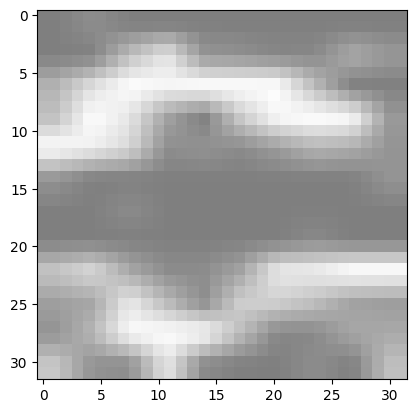

Label: c2


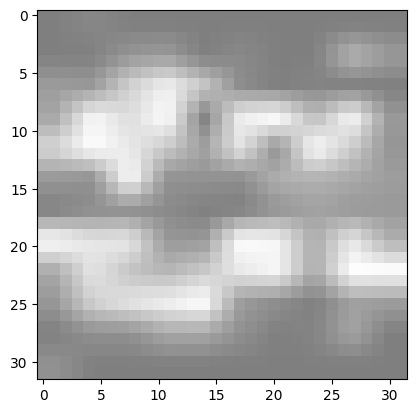

Label: c1


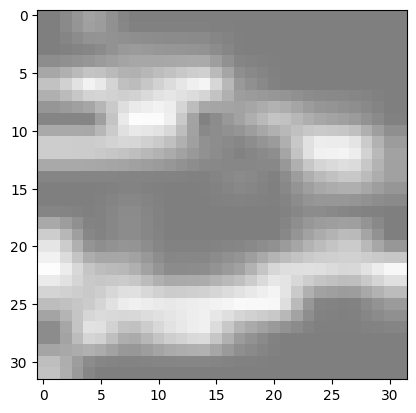

Label: c2


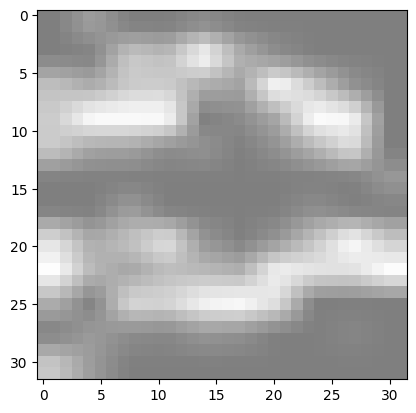

Tamanho do dataset: 140385 imagens


In [ ]:
# Carregar algumas amostras do DataLoader
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# Obter um batch de imagens
images, labels = next(iter(dataloader))

# Função para exibir imagens
def imshow(img):
    img = img / 2 + 0.5  # Desnormalizar
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)), interpolation='nearest')
    plt.show()

# Mostrar as imagens
for i in range(len(images)):
    print(f'Label: {dataset.classes[labels[i]]}')
    imshow(images[i])

# Verificar tamanho do dataset
print(f'Tamanho do dataset: {len(dataset)} imagens')

In [ ]:
# Verificar as classes atribuídas
print("Classes:", dataset.classes)

# Verificar alguns exemplos de labels
for idx, (path, label) in enumerate(dataset.imgs[50000:50100]):
    print(f"Path: {path}, Label: {label}")

Classes: ['c1', 'c2']
Path: E:\dataset2\c2\CE_individual_16_4_1965.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1966.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1967.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1968.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1969.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1970.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1971.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1972.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1973.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1974.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1975.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1976.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1977.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1978.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1979.png, Label: 1
Path: E:\dataset2\c2\CE_individual_16_4_1980.png, Label: 1
Path: E:\dataset2\c2\CE_individual

In [ ]:
print(torch.cuda.is_available())  # Deve retornar True se uma GPU com CUDA estiver disponível
print(torch.cuda.device_count())  # Retorna o número de GPUs disponíveis
print(torch.cuda.get_device_name(0))  # Retorna o nome da GPU (se disponível)


True
1
NVIDIA GeForce GTX 1060 6GB


In [ ]:
# Agrupar imagens por indivíduo
individual_groups = defaultdict(list)
for idx, (path, _) in enumerate(dataset.imgs):
    filename = os.path.basename(path)
    print(filename)
    individual_id = filename.split('_')[2]  # Extrair o número do indivíduo
    individual_groups[individual_id].append(idx)

# Converter grupos para listas
individuals = list(individual_groups.values())
print(individuals)

CE_individual_13_1_100.png
CE_individual_13_1_101.png
CE_individual_13_1_102.png
CE_individual_13_1_103.png
CE_individual_13_1_104.png
CE_individual_13_1_105.png
CE_individual_13_1_106.png
CE_individual_13_1_107.png
CE_individual_13_1_108.png
CE_individual_13_1_109.png
CE_individual_13_1_110.png
CE_individual_13_1_111.png
CE_individual_13_1_112.png
CE_individual_13_1_113.png
CE_individual_13_1_114.png
CE_individual_13_1_115.png
CE_individual_13_1_116.png
CE_individual_13_1_117.png
CE_individual_13_1_118.png
CE_individual_13_1_119.png
CE_individual_13_1_120.png
CE_individual_13_1_121.png
CE_individual_13_1_122.png
CE_individual_13_1_123.png
CE_individual_13_1_124.png
CE_individual_13_1_125.png
CE_individual_13_1_126.png
CE_individual_13_1_127.png
CE_individual_13_1_128.png
CE_individual_13_1_129.png
CE_individual_13_1_130.png
CE_individual_13_1_131.png
CE_individual_13_1_132.png
CE_individual_13_1_133.png
CE_individual_13_1_134.png
CE_individual_13_1_135.png
CE_individual_13_1_136.png
C

In [ ]:
# Definir o dispositivo (GPU se disponível)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Inicializar KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

Using device: cuda:0


In [ ]:
# RESNET50 COM UNDERSAMPLING
# Listas para armazenar as métricas de cada fold
accuracies = []
balanced_accuracies = []
f1_scores = []
roc_aucs = []
confusion_matrices = []

# Listas para armazenar as perdas (losses) de cada fold
training_losses = []
validation_losses = []

# Número do fold que você deseja utilizar (3 neste caso, que corresponde ao índice 2)
fold_desejado = 2

for fold, (train_idx, val_idx) in enumerate(kf.split(individuals)):
    if fold != fold_desejado:
        continue

    print(f'\nRodando apenas o Fold {fold + 1}/{k_folds}')

    # Obter os índices dos grupos para treino e validação
    train_indices = [idx for i in train_idx for idx in individuals[i]]
    val_indices = [idx for i in val_idx for idx in individuals[i]]

    # Obter os labels do conjunto de treino
    train_labels = [dataset.targets[idx] for idx in train_indices]

    # Dividir os índices em duas listas, uma para cada classe
    class_0_indices = [train_indices[i] for i in range(len(train_indices)) if train_labels[i] == 0]
    class_1_indices = [train_indices[i] for i in range(len(train_indices)) if train_labels[i] == 1]

    # Determinar o número de amostras na classe minoritária
    n_minority = min(len(class_0_indices), len(class_1_indices))

    # Realizar undersampling na classe majoritária para balancear as classes
    class_0_indices_resampled = resample(class_0_indices, replace=False, n_samples=n_minority, random_state=42)
    class_1_indices_resampled = resample(class_1_indices, replace=False, n_samples=n_minority, random_state=42)

    # Combinar as amostras resampled das duas classes
    train_indices_balanced = class_0_indices_resampled + class_1_indices_resampled

    # Agora, recalcular os labels após o undersampling
    train_labels_balanced = [dataset.targets[idx] for idx in train_indices_balanced]

    # Mostrar a nova distribuição das classes
    train_class_counts_balanced = Counter(train_labels_balanced)
    val_labels = [dataset.targets[idx] for idx in val_indices]
    val_class_counts = Counter(val_labels)

    print(f'Distribuição de classes no treinamento (balanceado): {train_class_counts_balanced}')
    print(f'Distribuição de classes na validação: {val_class_counts}')

    # Subconjuntos de treinamento e validação
    train_subset = Subset(dataset, train_indices_balanced)
    val_subset = Subset(dataset, val_indices)

    # DataLoader para treinamento e validação
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

    # Carregar a ResNet50 pré-treinada e ajustar a última camada
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
    # Modificar a primeira camada para aceitar imagens de 32x32
    model.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(dataset.classes))  # Ajustar para o número de classes

    # Congelar todas as camadas, exceto a última
    for param in model.parameters():
        param.requires_grad = False

    # Descongelar a primeira camada alterada e a camada fully connected
    for param in model.conv1.parameters():
        param.requires_grad = True

    # A última camada permanece treinável
    for param in model.fc.parameters():
        param.requires_grad = True

    # Mover o modelo para a GPU
    model = model.to(device)

    # Definir a loss function e o otimizador
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.00001)

    # Listas para armazenar as perdas por época
    fold_training_losses = []
    fold_validation_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        # Usando tqdm para mostrar o progresso das batches
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', leave=False)
        for inputs, labels in progress_bar:
            # Mover os dados para a GPU
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            # Atualizando a barra de progresso com a perda atual
            progress_bar.set_postfix(loss=running_loss/len(train_loader))

        # Armazenar a perda de treinamento da época atual
        fold_training_losses.append(running_loss/len(train_loader))

        # Registrar a perda de treinamento no TensorBoard
        writer.add_scalar(f'Fold_{fold+1}/Training_Loss', running_loss/len(train_loader), epoch)

        print(f'Epoch [{epoch + 1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}')

        # Validação após cada época
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        all_labels = []
        all_predictions = []
        all_probabilities = []

        with torch.no_grad():
            for inputs, labels in val_loader:
                # Mover os dados para a GPU
                inputs, labels = inputs.to(device), labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                probabilities = torch.softmax(outputs, dim=1)[:, 1]  # Probabilidade da classe 1

                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                all_probabilities.extend(probabilities.cpu().numpy())

                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        # Armazenar a perda de validação da época atual
        fold_validation_losses.append(val_loss/len(val_loader))

        # Calcular as métricas
        accuracy = 100 * correct / total
        balanced_acc = balanced_accuracy_score(all_labels, all_predictions)
        f1 = f1_score(all_labels, all_predictions, average='binary')
        roc_auc = roc_auc_score(all_labels, all_probabilities)

        print(f'Validation Loss: {val_loss/len(val_loader):.4f}, Accuracy: {accuracy:.2f}%')
        print(f'Balanced Accuracy: {balanced_acc:.4f}')
        print(f'F1-Score: {f1:.4f}')
        print(f'ROC-AUC: {roc_auc:.4f}')

        # Registrar a perda e as métricas de validação no TensorBoard
        writer.add_scalar(f'Fold_{fold+1}/Validation_Loss', val_loss/len(val_loader), epoch)
        writer.add_scalar(f'Fold_{fold+1}/Accuracy', accuracy, epoch)
        writer.add_scalar(f'Fold_{fold+1}/Balanced_Accuracy', balanced_acc, epoch)
        writer.add_scalar(f'Fold_{fold+1}/F1_Score', f1, epoch)
        writer.add_scalar(f'Fold_{fold+1}/ROC_AUC', roc_auc, epoch)


    # Calcular a matriz de confusão após o último epoch do fold
    conf_matrix = confusion_matrix(all_labels, all_predictions)
    confusion_matrices.append(conf_matrix)

    # Armazenar as métricas finais do fold
    accuracies.append(accuracy)
    balanced_accuracies.append(balanced_acc)
    f1_scores.append(f1)
    roc_aucs.append(roc_auc)

    # Armazenar as perdas de treinamento e validação para o fold
    training_losses.append(fold_training_losses)
    validation_losses.append(fold_validation_losses)

    print(f'Matriz de Confusão do Fold {fold + 1}:\n{conf_matrix}')

# Comparação das métricas para o fold 3
print('\nResultados do Fold 3:')
print(f'Acurácia: {accuracies[-1]:.2f}%')
print(f'Acurácia Balanceada: {balanced_accuracies[-1]:.4f}')
print(f'F1-Score: {f1_scores[-1]:.4f}')
print(f'ROC-AUC: {roc_aucs[-1]:.4f}')

# Mostrar a matriz de confusão do fold 3
print(f'\nMatriz de Confusão do Fold 3:\n{confusion_matrices[-1]}')



Rodando apenas o Fold 3/5
Distribuição de classes no treinamento (balanceado): Counter({0: 37701, 1: 37701})
Distribuição de classes na validação: Counter({1: 12241, 0: 6000})


Epoch [1/250], Training Loss: 0.6510
Validation Loss: 0.6611, Accuracy: 61.83%
Balanced Accuracy: 0.6172
F1-Score: 0.6857
ROC-AUC: 0.6481


Epoch [2/250], Training Loss: 0.5375
Validation Loss: 0.6411, Accuracy: 66.62%
Balanced Accuracy: 0.6429
F1-Score: 0.7409
ROC-AUC: 0.6651


Epoch [3/250], Training Loss: 0.4558
Validation Loss: 0.6338, Accuracy: 67.14%
Balanced Accuracy: 0.6369
F1-Score: 0.7508
ROC-AUC: 0.6511


Epoch [4/250], Training Loss: 0.3932
Validation Loss: 0.6085, Accuracy: 71.44%
Balanced Accuracy: 0.6658
F1-Score: 0.7915
ROC-AUC: 0.6822


Epoch [5/250], Training Loss: 0.3461
Validation Loss: 0.6147, Accuracy: 70.85%
Balanced Accuracy: 0.6649
F1-Score: 0.7848
ROC-AUC: 0.6782


Epoch [6/250], Training Loss: 0.3049
Validation Loss: 0.6056, Accuracy: 72.19%
Balanced Accuracy: 0.6710
F1-Score: 0.7983
ROC-AUC: 0.6844


Epoch [7/250], Training Loss: 0.2721
Validation Loss: 0.6312, Accuracy: 67.87%
Balanced Accuracy: 0.6453
F1-Score: 0.7563
ROC-AUC: 0.6616


Epoch [8/250], Training Loss: 0.2428
Validation Loss: 0.6222, Accuracy: 69.24%
Balanced Accuracy: 0.6411
F1-Score: 0.7754
ROC-AUC: 0.6544


Epoch [9/250], Training Loss: 0.2201
Validation Loss: 0.6419, Accuracy: 68.51%
Balanced Accuracy: 0.6371
F1-Score: 0.7681
ROC-AUC: 0.6493


Epoch [10/250], Training Loss: 0.1995
Validation Loss: 0.6296, Accuracy: 67.52%
Balanced Accuracy: 0.6274
F1-Score: 0.7602
ROC-AUC: 0.6512


Epoch [11/250], Training Loss: 0.1819
Validation Loss: 0.6492, Accuracy: 67.31%
Balanced Accuracy: 0.6195
F1-Score: 0.7612
ROC-AUC: 0.6353


Epoch [12/250], Training Loss: 0.1669
Validation Loss: 0.6693, Accuracy: 67.65%
Balanced Accuracy: 0.6128
F1-Score: 0.7682
ROC-AUC: 0.6270


Epoch [13/250], Training Loss: 0.1542
Validation Loss: 0.6347, Accuracy: 66.32%
Balanced Accuracy: 0.6068
F1-Score: 0.7546
ROC-AUC: 0.6461


Epoch [14/250], Training Loss: 0.1414
Validation Loss: 0.6477, Accuracy: 66.88%
Balanced Accuracy: 0.6145
F1-Score: 0.7580
ROC-AUC: 0.6522


Epoch [15/250], Training Loss: 0.1310
Validation Loss: 0.6663, Accuracy: 65.91%
Balanced Accuracy: 0.6036
F1-Score: 0.7509
ROC-AUC: 0.6418


Epoch [16/250], Training Loss: 0.1220
Validation Loss: 0.6897, Accuracy: 65.60%
Balanced Accuracy: 0.5991
F1-Score: 0.7492
ROC-AUC: 0.6245


Epoch [17/250], Training Loss: 0.1143
Validation Loss: 0.6730, Accuracy: 65.79%
Balanced Accuracy: 0.6032
F1-Score: 0.7496
ROC-AUC: 0.6450


Epoch [18/250], Training Loss: 0.1056
Validation Loss: 0.6464, Accuracy: 68.10%
Balanced Accuracy: 0.6107
F1-Score: 0.7745
ROC-AUC: 0.6590


Epoch [19/250], Training Loss: 0.0998
Validation Loss: 0.6684, Accuracy: 67.80%
Balanced Accuracy: 0.6108
F1-Score: 0.7709
ROC-AUC: 0.6531


Epoch [20/250], Training Loss: 0.0938
Validation Loss: 0.6426, Accuracy: 66.64%
Balanced Accuracy: 0.6089
F1-Score: 0.7576
ROC-AUC: 0.6682


Epoch [21/250], Training Loss: 0.0887
Validation Loss: 0.6656, Accuracy: 66.89%
Balanced Accuracy: 0.6101
F1-Score: 0.7601
ROC-AUC: 0.6657


Epoch [22/250], Training Loss: 0.0836
Validation Loss: 0.6691, Accuracy: 68.84%
Balanced Accuracy: 0.6293
F1-Score: 0.7756
ROC-AUC: 0.6751


Epoch [23/250], Training Loss: 0.0797
Validation Loss: 0.6620, Accuracy: 67.15%
Balanced Accuracy: 0.6180
F1-Score: 0.7599
ROC-AUC: 0.6798


Epoch [24/250], Training Loss: 0.0757
Validation Loss: 0.6705, Accuracy: 67.80%
Balanced Accuracy: 0.6118
F1-Score: 0.7704
ROC-AUC: 0.6673


Epoch [25/250], Training Loss: 0.0723
Validation Loss: 0.6550, Accuracy: 69.56%
Balanced Accuracy: 0.6351
F1-Score: 0.7817
ROC-AUC: 0.6956


Epoch [26/250], Training Loss: 0.0683
Validation Loss: 0.6892, Accuracy: 68.71%
Balanced Accuracy: 0.6225
F1-Score: 0.7768
ROC-AUC: 0.6641


Epoch [27/250], Training Loss: 0.0649
Validation Loss: 0.6942, Accuracy: 66.88%
Balanced Accuracy: 0.6085
F1-Score: 0.7607
ROC-AUC: 0.6604


Epoch [28/250], Training Loss: 0.0629
Validation Loss: 0.7053, Accuracy: 68.75%
Balanced Accuracy: 0.6136
F1-Score: 0.7808
ROC-AUC: 0.6682


Epoch [29/250], Training Loss: 0.0597
Validation Loss: 0.6842, Accuracy: 68.40%
Balanced Accuracy: 0.6145
F1-Score: 0.7764
ROC-AUC: 0.6679


Epoch [30/250], Training Loss: 0.0582
Validation Loss: 0.6334, Accuracy: 70.65%
Balanced Accuracy: 0.6414
F1-Score: 0.7918
ROC-AUC: 0.7022


Epoch [31/250], Training Loss: 0.0550
Validation Loss: 0.6550, Accuracy: 69.75%
Balanced Accuracy: 0.6375
F1-Score: 0.7830
ROC-AUC: 0.6839


Epoch [32/250], Training Loss: 0.0535
Validation Loss: 0.6752, Accuracy: 69.52%
Balanced Accuracy: 0.6287
F1-Score: 0.7838
ROC-AUC: 0.6763


Epoch [33/250], Training Loss: 0.0508
Validation Loss: 0.6952, Accuracy: 69.78%
Balanced Accuracy: 0.6321
F1-Score: 0.7854
ROC-AUC: 0.6766


Epoch [34/250], Training Loss: 0.0490
Validation Loss: 0.6904, Accuracy: 68.99%
Balanced Accuracy: 0.6300
F1-Score: 0.7770
ROC-AUC: 0.6795


Epoch [35/250], Training Loss: 0.0475
Validation Loss: 0.7214, Accuracy: 68.68%
Balanced Accuracy: 0.6134
F1-Score: 0.7801
ROC-AUC: 0.6770


Epoch [36/250], Training Loss: 0.0456
Validation Loss: 0.6802, Accuracy: 68.65%
Balanced Accuracy: 0.6183
F1-Score: 0.7778
ROC-AUC: 0.6663


Epoch [37/250], Training Loss: 0.0433
Validation Loss: 0.7366, Accuracy: 68.89%
Balanced Accuracy: 0.6195
F1-Score: 0.7801
ROC-AUC: 0.6629


Epoch [38/250], Training Loss: 0.0427
Validation Loss: 0.7723, Accuracy: 69.74%
Balanced Accuracy: 0.6249
F1-Score: 0.7877
ROC-AUC: 0.6535


Epoch [39/250], Training Loss: 0.0426
Validation Loss: 0.7226, Accuracy: 70.41%
Balanced Accuracy: 0.6410
F1-Score: 0.7892
ROC-AUC: 0.6750


Epoch [40/250], Training Loss: 0.0401
Validation Loss: 0.7429, Accuracy: 70.28%
Balanced Accuracy: 0.6389
F1-Score: 0.7885
ROC-AUC: 0.6824


Epoch [41/250], Training Loss: 0.0389
Validation Loss: 0.7385, Accuracy: 68.87%
Balanced Accuracy: 0.6215
F1-Score: 0.7791
ROC-AUC: 0.6737


Epoch [42/250], Training Loss: 0.0376
Validation Loss: 0.7223, Accuracy: 71.20%
Balanced Accuracy: 0.6449
F1-Score: 0.7967
ROC-AUC: 0.6957


Epoch [43/250], Training Loss: 0.0366
Validation Loss: 0.7333, Accuracy: 68.84%
Balanced Accuracy: 0.6140
F1-Score: 0.7818
ROC-AUC: 0.6744


Epoch [44/250], Training Loss: 0.0358
Validation Loss: 0.7411, Accuracy: 69.66%
Balanced Accuracy: 0.6203
F1-Score: 0.7886
ROC-AUC: 0.6691


Epoch [45/250], Training Loss: 0.0353
Validation Loss: 0.8057, Accuracy: 68.51%
Balanced Accuracy: 0.6053
F1-Score: 0.7814
ROC-AUC: 0.6554


Epoch [46/250], Training Loss: 0.0341
Validation Loss: 0.7877, Accuracy: 69.85%
Balanced Accuracy: 0.6202
F1-Score: 0.7908
ROC-AUC: 0.6665


Epoch [47/250], Training Loss: 0.0331
Validation Loss: 0.7568, Accuracy: 70.78%
Balanced Accuracy: 0.6309
F1-Score: 0.7972
ROC-AUC: 0.6935


Epoch [48/250], Training Loss: 0.0320
Validation Loss: 0.8210, Accuracy: 68.09%
Balanced Accuracy: 0.6114
F1-Score: 0.7740
ROC-AUC: 0.6582


Epoch [49/250], Training Loss: 0.0315
Validation Loss: 0.7777, Accuracy: 68.87%
Balanced Accuracy: 0.6138
F1-Score: 0.7822
ROC-AUC: 0.6669


Epoch [50/250], Training Loss: 0.0312
Validation Loss: 0.8002, Accuracy: 70.74%
Balanced Accuracy: 0.6349
F1-Score: 0.7952
ROC-AUC: 0.6705


Epoch [51/250], Training Loss: 0.0292
Validation Loss: 0.8055, Accuracy: 69.66%
Balanced Accuracy: 0.6231
F1-Score: 0.7875
ROC-AUC: 0.6701


Epoch [52/250], Training Loss: 0.0290
Validation Loss: 0.7585, Accuracy: 70.93%
Balanced Accuracy: 0.6327
F1-Score: 0.7982
ROC-AUC: 0.6894


Epoch [53/250], Training Loss: 0.0280
Validation Loss: 0.7860, Accuracy: 71.28%
Balanced Accuracy: 0.6374
F1-Score: 0.8003
ROC-AUC: 0.6829


Epoch [54/250], Training Loss: 0.0281
Validation Loss: 0.8136, Accuracy: 69.74%
Balanced Accuracy: 0.6241
F1-Score: 0.7881
ROC-AUC: 0.6512


Epoch [55/250], Training Loss: 0.0275
Validation Loss: 0.8063, Accuracy: 69.69%
Balanced Accuracy: 0.6168
F1-Score: 0.7903
ROC-AUC: 0.6741


Epoch [56/250], Training Loss: 0.0258
Validation Loss: 0.8241, Accuracy: 69.75%
Balanced Accuracy: 0.6235
F1-Score: 0.7884
ROC-AUC: 0.6736


Epoch [57/250], Training Loss: 0.0267
Validation Loss: 0.7987, Accuracy: 71.20%
Balanced Accuracy: 0.6343
F1-Score: 0.8005
ROC-AUC: 0.6897


Epoch [58/250], Training Loss: 0.0250
Validation Loss: 0.8113, Accuracy: 70.33%
Balanced Accuracy: 0.6217
F1-Score: 0.7955
ROC-AUC: 0.6817


Epoch [59/250], Training Loss: 0.0254
Validation Loss: 0.8407, Accuracy: 70.47%
Balanced Accuracy: 0.6302
F1-Score: 0.7940
ROC-AUC: 0.6698


Epoch [60/250], Training Loss: 0.0247
Validation Loss: 0.7814, Accuracy: 70.06%
Balanced Accuracy: 0.6243
F1-Score: 0.7916
ROC-AUC: 0.7013


Epoch [61/250], Training Loss: 0.0238
Validation Loss: 0.8889, Accuracy: 68.80%
Balanced Accuracy: 0.6124
F1-Score: 0.7818
ROC-AUC: 0.6568


Epoch [62/250], Training Loss: 0.0248
Validation Loss: 0.7860, Accuracy: 70.74%
Balanced Accuracy: 0.6310
F1-Score: 0.7966
ROC-AUC: 0.6980


Epoch [63/250], Training Loss: 0.0225
Validation Loss: 0.8255, Accuracy: 69.31%
Balanced Accuracy: 0.6120
F1-Score: 0.7878
ROC-AUC: 0.6930


Epoch [64/250], Training Loss: 0.0226
Validation Loss: 0.7883, Accuracy: 70.83%
Balanced Accuracy: 0.6405
F1-Score: 0.7942
ROC-AUC: 0.7019


Epoch [65/250], Training Loss: 0.0225
Validation Loss: 0.8498, Accuracy: 69.97%
Balanced Accuracy: 0.6294
F1-Score: 0.7887
ROC-AUC: 0.6684


Epoch [66/250], Training Loss: 0.0218
Validation Loss: 0.7521, Accuracy: 71.13%
Balanced Accuracy: 0.6394
F1-Score: 0.7979
ROC-AUC: 0.7195


Epoch [67/250], Training Loss: 0.0226
Validation Loss: 0.7587, Accuracy: 69.99%
Balanced Accuracy: 0.6281
F1-Score: 0.7894
ROC-AUC: 0.7063


Epoch [68/250], Training Loss: 0.0220
Validation Loss: 0.7452, Accuracy: 72.06%
Balanced Accuracy: 0.6535
F1-Score: 0.8032
ROC-AUC: 0.7067


Epoch [69/250], Training Loss: 0.0215
Validation Loss: 0.7467, Accuracy: 72.18%
Balanced Accuracy: 0.6491
F1-Score: 0.8061
ROC-AUC: 0.7287


Epoch [70/250], Training Loss: 0.0221
Validation Loss: 0.7738, Accuracy: 71.76%
Balanced Accuracy: 0.6450
F1-Score: 0.8029
ROC-AUC: 0.7216


Epoch [71/250], Training Loss: 0.0209
Validation Loss: 0.7490, Accuracy: 71.34%
Balanced Accuracy: 0.6407
F1-Score: 0.7998
ROC-AUC: 0.7206


Epoch [72/250], Training Loss: 0.0204
Validation Loss: 0.8106, Accuracy: 70.79%
Balanced Accuracy: 0.6283
F1-Score: 0.7982
ROC-AUC: 0.7033


Epoch [73/250], Training Loss: 0.0194
Validation Loss: 0.8648, Accuracy: 69.46%
Balanced Accuracy: 0.6211
F1-Score: 0.7861
ROC-AUC: 0.6628


Epoch [74/250], Training Loss: 0.0193
Validation Loss: 0.7759, Accuracy: 71.77%
Balanced Accuracy: 0.6434
F1-Score: 0.8036
ROC-AUC: 0.7116


Epoch [75/250], Training Loss: 0.0201
Validation Loss: 0.8753, Accuracy: 69.78%
Balanced Accuracy: 0.6215
F1-Score: 0.7895
ROC-AUC: 0.6828


Epoch [76/250], Training Loss: 0.0184
Validation Loss: 0.8071, Accuracy: 70.26%
Balanced Accuracy: 0.6272
F1-Score: 0.7927
ROC-AUC: 0.7049


Epoch [77/250], Training Loss: 0.0185
Validation Loss: 0.8533, Accuracy: 71.01%
Balanced Accuracy: 0.6295
F1-Score: 0.8002
ROC-AUC: 0.6955


Epoch [78/250], Training Loss: 0.0184
Validation Loss: 0.8494, Accuracy: 71.65%
Balanced Accuracy: 0.6411
F1-Score: 0.8030
ROC-AUC: 0.7039


Epoch [79/250], Training Loss: 0.0185
Validation Loss: 0.8056, Accuracy: 70.25%
Balanced Accuracy: 0.6277
F1-Score: 0.7924
ROC-AUC: 0.7043


Epoch [80/250], Training Loss: 0.0174
Validation Loss: 0.8441, Accuracy: 69.61%
Balanced Accuracy: 0.6167
F1-Score: 0.7894
ROC-AUC: 0.6934


Epoch [81/250], Training Loss: 0.0177
Validation Loss: 0.9184, Accuracy: 69.23%
Balanced Accuracy: 0.6100
F1-Score: 0.7877
ROC-AUC: 0.6698


Epoch [82/250], Training Loss: 0.0170
Validation Loss: 0.9172, Accuracy: 68.58%
Balanced Accuracy: 0.6029
F1-Score: 0.7830
ROC-AUC: 0.6616


Epoch [83/250], Training Loss: 0.0183
Validation Loss: 0.8786, Accuracy: 69.84%
Balanced Accuracy: 0.6216
F1-Score: 0.7902
ROC-AUC: 0.6756


Epoch [84/250], Training Loss: 0.0170
Validation Loss: 0.8611, Accuracy: 70.42%
Balanced Accuracy: 0.6244
F1-Score: 0.7956
ROC-AUC: 0.6911


Epoch [85/250], Training Loss: 0.0164
Validation Loss: 0.8680, Accuracy: 70.12%
Balanced Accuracy: 0.6235
F1-Score: 0.7925
ROC-AUC: 0.6893


Epoch [86/250], Training Loss: 0.0169
Validation Loss: 0.8499, Accuracy: 70.17%
Balanced Accuracy: 0.6323
F1-Score: 0.7898
ROC-AUC: 0.6893


Epoch [87/250], Training Loss: 0.0165
Validation Loss: 0.8611, Accuracy: 68.38%
Balanced Accuracy: 0.6050
F1-Score: 0.7800
ROC-AUC: 0.6900


Epoch [88/250], Training Loss: 0.0162
Validation Loss: 0.8589, Accuracy: 68.71%
Balanced Accuracy: 0.6102
F1-Score: 0.7817
ROC-AUC: 0.6940


Epoch [89/250], Training Loss: 0.0153
Validation Loss: 0.8231, Accuracy: 69.24%
Balanced Accuracy: 0.6312
F1-Score: 0.7795
ROC-AUC: 0.6904


Epoch [90/250], Training Loss: 0.0166
Validation Loss: 0.8384, Accuracy: 69.76%
Balanced Accuracy: 0.6160
F1-Score: 0.7913
ROC-AUC: 0.7009


Epoch [91/250], Training Loss: 0.0160
Validation Loss: 0.8284, Accuracy: 70.46%
Balanced Accuracy: 0.6242
F1-Score: 0.7961
ROC-AUC: 0.7183


Epoch [92/250], Training Loss: 0.0149
Validation Loss: 0.8095, Accuracy: 69.85%
Balanced Accuracy: 0.6230
F1-Score: 0.7898
ROC-AUC: 0.7068


Epoch [93/250], Training Loss: 0.0151
Validation Loss: 0.8144, Accuracy: 70.53%
Balanced Accuracy: 0.6352
F1-Score: 0.7928
ROC-AUC: 0.7199


Epoch [94/250], Training Loss: 0.0150
Validation Loss: 0.8375, Accuracy: 70.90%
Balanced Accuracy: 0.6341
F1-Score: 0.7973
ROC-AUC: 0.7069


Epoch [95/250], Training Loss: 0.0148
Validation Loss: 0.9066, Accuracy: 68.63%
Balanced Accuracy: 0.6189
F1-Score: 0.7773
ROC-AUC: 0.6702


Epoch [96/250], Training Loss: 0.0144
Validation Loss: 0.8176, Accuracy: 70.64%
Balanced Accuracy: 0.6321
F1-Score: 0.7952
ROC-AUC: 0.7027


Epoch [97/250], Training Loss: 0.0156
Validation Loss: 0.9154, Accuracy: 70.11%
Balanced Accuracy: 0.6250
F1-Score: 0.7918
ROC-AUC: 0.6798


Epoch [98/250], Training Loss: 0.0142
Validation Loss: 0.9023, Accuracy: 68.82%
Balanced Accuracy: 0.6166
F1-Score: 0.7805
ROC-AUC: 0.6764


Epoch [99/250], Training Loss: 0.0138
Validation Loss: 0.8450, Accuracy: 70.98%
Balanced Accuracy: 0.6339
F1-Score: 0.7983
ROC-AUC: 0.7081


Epoch [100/250], Training Loss: 0.0143
Validation Loss: 0.9235, Accuracy: 69.52%
Balanced Accuracy: 0.6156
F1-Score: 0.7889
ROC-AUC: 0.6840


Epoch [101/250], Training Loss: 0.0140
Validation Loss: 0.9029, Accuracy: 70.20%
Balanced Accuracy: 0.6227
F1-Score: 0.7938
ROC-AUC: 0.6892


Epoch [102/250], Training Loss: 0.0135
Validation Loss: 0.8688, Accuracy: 69.39%
Balanced Accuracy: 0.6201
F1-Score: 0.7856
ROC-AUC: 0.6894


Epoch [103/250], Training Loss: 0.0136
Validation Loss: 0.8877, Accuracy: 69.53%
Balanced Accuracy: 0.6282
F1-Score: 0.7841
ROC-AUC: 0.6865


Epoch [104/250], Training Loss: 0.0133
Validation Loss: 0.8698, Accuracy: 68.57%
Balanced Accuracy: 0.6135
F1-Score: 0.7788
ROC-AUC: 0.6790


Epoch [105/250], Training Loss: 0.0137
Validation Loss: 0.8631, Accuracy: 68.63%
Balanced Accuracy: 0.6141
F1-Score: 0.7792
ROC-AUC: 0.6963


Epoch [106/250], Training Loss: 0.0131
Validation Loss: 0.9126, Accuracy: 70.91%
Balanced Accuracy: 0.6365
F1-Score: 0.7966
ROC-AUC: 0.6994


Epoch [107/250], Training Loss: 0.0129
Validation Loss: 0.8623, Accuracy: 70.00%
Balanced Accuracy: 0.6307
F1-Score: 0.7884
ROC-AUC: 0.6992


Epoch [108/250], Training Loss: 0.0135
Validation Loss: 0.7668, Accuracy: 70.68%
Balanced Accuracy: 0.6359
F1-Score: 0.7942
ROC-AUC: 0.7237


Epoch [109/250], Training Loss: 0.0133
Validation Loss: 0.9012, Accuracy: 68.49%
Balanced Accuracy: 0.6163
F1-Score: 0.7767
ROC-AUC: 0.6898


Epoch [110/250], Training Loss: 0.0125
Validation Loss: 0.9792, Accuracy: 68.95%
Balanced Accuracy: 0.6222
F1-Score: 0.7798
ROC-AUC: 0.6728


Epoch [111/250], Training Loss: 0.0126
Validation Loss: 0.9367, Accuracy: 69.06%
Balanced Accuracy: 0.6180
F1-Score: 0.7827
ROC-AUC: 0.6780


Epoch [112/250], Training Loss: 0.0125
Validation Loss: 0.9782, Accuracy: 67.60%
Balanced Accuracy: 0.5961
F1-Score: 0.7746
ROC-AUC: 0.6760


Epoch [113/250], Training Loss: 0.0123
Validation Loss: 0.9074, Accuracy: 69.15%
Balanced Accuracy: 0.6138
F1-Score: 0.7853
ROC-AUC: 0.6983


Epoch [114/250], Training Loss: 0.0123
Validation Loss: 0.8237, Accuracy: 69.01%
Balanced Accuracy: 0.6173
F1-Score: 0.7824
ROC-AUC: 0.7242


Epoch [115/250], Training Loss: 0.0125
Validation Loss: 0.8737, Accuracy: 70.08%
Balanced Accuracy: 0.6341
F1-Score: 0.7881
ROC-AUC: 0.6973


Epoch [116/250], Training Loss: 0.0129
Validation Loss: 0.8470, Accuracy: 69.10%
Balanced Accuracy: 0.6188
F1-Score: 0.7828
ROC-AUC: 0.7134


Epoch [117/250], Training Loss: 0.0120
Validation Loss: 0.8940, Accuracy: 68.91%
Balanced Accuracy: 0.6228
F1-Score: 0.7790
ROC-AUC: 0.6930


Epoch [118/250], Training Loss: 0.0115
Validation Loss: 0.8893, Accuracy: 69.30%
Balanced Accuracy: 0.6230
F1-Score: 0.7835
ROC-AUC: 0.7069


Epoch [119/250], Training Loss: 0.0122
Validation Loss: 0.9869, Accuracy: 69.66%
Balanced Accuracy: 0.6220
F1-Score: 0.7880
ROC-AUC: 0.6719


Epoch [120/250], Training Loss: 0.0114
Validation Loss: 0.8982, Accuracy: 70.58%
Balanced Accuracy: 0.6365
F1-Score: 0.7929
ROC-AUC: 0.6931


Epoch [121/250], Training Loss: 0.0115
Validation Loss: 0.9548, Accuracy: 69.83%
Balanced Accuracy: 0.6240
F1-Score: 0.7891
ROC-AUC: 0.6902


Epoch [122/250], Training Loss: 0.0116
Validation Loss: 0.9181, Accuracy: 69.23%
Balanced Accuracy: 0.6210
F1-Score: 0.7835
ROC-AUC: 0.6908


Epoch [123/250], Training Loss: 0.0116
Validation Loss: 0.9198, Accuracy: 69.47%
Balanced Accuracy: 0.6196
F1-Score: 0.7867
ROC-AUC: 0.6789


Epoch [124/250], Training Loss: 0.0113
Validation Loss: 0.9575, Accuracy: 69.49%
Balanced Accuracy: 0.6185
F1-Score: 0.7874
ROC-AUC: 0.6886


Epoch [125/250], Training Loss: 0.0114
Validation Loss: 0.9019, Accuracy: 69.62%
Balanced Accuracy: 0.6236
F1-Score: 0.7869
ROC-AUC: 0.7091


Epoch [126/250], Training Loss: 0.0111
Validation Loss: 0.9894, Accuracy: 68.94%
Balanced Accuracy: 0.6122
F1-Score: 0.7836
ROC-AUC: 0.6757


Epoch [127/250], Training Loss: 0.0106
Validation Loss: 0.9889, Accuracy: 70.20%
Balanced Accuracy: 0.6289
F1-Score: 0.7914
ROC-AUC: 0.6852


Epoch [128/250], Training Loss: 0.0110
Validation Loss: 0.9486, Accuracy: 70.05%
Balanced Accuracy: 0.6246
F1-Score: 0.7913
ROC-AUC: 0.6868


Epoch [129/250], Training Loss: 0.0104
Validation Loss: 0.9867, Accuracy: 68.09%
Balanced Accuracy: 0.6100
F1-Score: 0.7746
ROC-AUC: 0.6682


Epoch [130/250], Training Loss: 0.0108
Validation Loss: 0.9888, Accuracy: 69.63%
Balanced Accuracy: 0.6197
F1-Score: 0.7885
ROC-AUC: 0.6833


Epoch [131/250], Training Loss: 0.0111
Validation Loss: 0.9764, Accuracy: 68.44%
Balanced Accuracy: 0.6161
F1-Score: 0.7762
ROC-AUC: 0.6727


Epoch [132/250], Training Loss: 0.0116
Validation Loss: 0.8914, Accuracy: 70.25%
Balanced Accuracy: 0.6244
F1-Score: 0.7936
ROC-AUC: 0.7097


Epoch [133/250], Training Loss: 0.0118
Validation Loss: 0.8282, Accuracy: 69.75%
Balanced Accuracy: 0.6363
F1-Score: 0.7834
ROC-AUC: 0.7217


Epoch [134/250], Training Loss: 0.0120
Validation Loss: 0.9107, Accuracy: 68.86%
Balanced Accuracy: 0.6128
F1-Score: 0.7824
ROC-AUC: 0.6997


Epoch [135/250], Training Loss: 0.0113
Validation Loss: 0.9401, Accuracy: 68.11%
Balanced Accuracy: 0.6059
F1-Score: 0.7765
ROC-AUC: 0.6798


Epoch [136/250], Training Loss: 0.0099
Validation Loss: 0.8968, Accuracy: 68.33%
Balanced Accuracy: 0.6107
F1-Score: 0.7772
ROC-AUC: 0.6885


Epoch [137/250], Training Loss: 0.0102
Validation Loss: 0.8728, Accuracy: 69.67%
Balanced Accuracy: 0.6193
F1-Score: 0.7891
ROC-AUC: 0.7208


Epoch [138/250], Training Loss: 0.0097
Validation Loss: 0.9581, Accuracy: 69.12%
Balanced Accuracy: 0.6143
F1-Score: 0.7849
ROC-AUC: 0.6821


Epoch [139/250], Training Loss: 0.0106
Validation Loss: 0.9343, Accuracy: 69.77%
Balanced Accuracy: 0.6161
F1-Score: 0.7914
ROC-AUC: 0.6920


Epoch [140/250], Training Loss: 0.0104
Validation Loss: 0.9292, Accuracy: 69.81%
Balanced Accuracy: 0.6226
F1-Score: 0.7894
ROC-AUC: 0.6828


Epoch [141/250], Training Loss: 0.0097
Validation Loss: 0.8664, Accuracy: 69.89%
Balanced Accuracy: 0.6211
F1-Score: 0.7908
ROC-AUC: 0.7246


Epoch [142/250], Training Loss: 0.0100
Validation Loss: 0.8873, Accuracy: 70.24%
Balanced Accuracy: 0.6287
F1-Score: 0.7920
ROC-AUC: 0.7119


Epoch [143/250], Training Loss: 0.0100
Validation Loss: 0.8435, Accuracy: 70.85%
Balanced Accuracy: 0.6381
F1-Score: 0.7953
ROC-AUC: 0.7164


Epoch [144/250], Training Loss: 0.0103
Validation Loss: 0.9195, Accuracy: 69.72%
Balanced Accuracy: 0.6223
F1-Score: 0.7885
ROC-AUC: 0.7059


Epoch [145/250], Training Loss: 0.0093
Validation Loss: 0.9393, Accuracy: 70.35%
Balanced Accuracy: 0.6272
F1-Score: 0.7937
ROC-AUC: 0.7049


Epoch [146/250], Training Loss: 0.0099
Validation Loss: 0.9893, Accuracy: 70.01%
Balanced Accuracy: 0.6226
F1-Score: 0.7916
ROC-AUC: 0.6976


Epoch [147/250], Training Loss: 0.0094
Validation Loss: 0.9338, Accuracy: 69.20%
Balanced Accuracy: 0.6286
F1-Score: 0.7800
ROC-AUC: 0.6831


Epoch [148/250], Training Loss: 0.0096
Validation Loss: 0.8425, Accuracy: 69.33%
Balanced Accuracy: 0.6183
F1-Score: 0.7857
ROC-AUC: 0.7166


Epoch [149/250], Training Loss: 0.0090
Validation Loss: 0.9979, Accuracy: 69.63%
Balanced Accuracy: 0.6265
F1-Score: 0.7859
ROC-AUC: 0.6698


Epoch [150/250], Training Loss: 0.0091
Validation Loss: 1.0073, Accuracy: 68.41%
Balanced Accuracy: 0.6084
F1-Score: 0.7790
ROC-AUC: 0.6755


Epoch [151/250], Training Loss: 0.0100
Validation Loss: 0.8926, Accuracy: 70.26%
Balanced Accuracy: 0.6397
F1-Score: 0.7880
ROC-AUC: 0.6977


Epoch [152/250], Training Loss: 0.0093
Validation Loss: 0.9364, Accuracy: 69.77%
Balanced Accuracy: 0.6321
F1-Score: 0.7853
ROC-AUC: 0.7015


Epoch [153/250], Training Loss: 0.0092
Validation Loss: 0.9151, Accuracy: 70.17%
Balanced Accuracy: 0.6243
F1-Score: 0.7928
ROC-AUC: 0.6967


Epoch [154/250], Training Loss: 0.0095
Validation Loss: 0.9896, Accuracy: 69.51%
Balanced Accuracy: 0.6155
F1-Score: 0.7887
ROC-AUC: 0.6815


Epoch [155/250], Training Loss: 0.0095
Validation Loss: 0.9812, Accuracy: 68.76%
Balanced Accuracy: 0.6100
F1-Score: 0.7824
ROC-AUC: 0.6776


Epoch [156/250], Training Loss: 0.0089
Validation Loss: 0.9074, Accuracy: 69.01%
Balanced Accuracy: 0.6175
F1-Score: 0.7824
ROC-AUC: 0.7056


Epoch [157/250], Training Loss: 0.0086
Validation Loss: 0.9798, Accuracy: 69.12%
Balanced Accuracy: 0.6211
F1-Score: 0.7822
ROC-AUC: 0.6948


Epoch [158/250], Training Loss: 0.0089
Validation Loss: 0.9289, Accuracy: 70.56%
Balanced Accuracy: 0.6434
F1-Score: 0.7900
ROC-AUC: 0.7052


Epoch [159/250], Training Loss: 0.0092
Validation Loss: 0.9784, Accuracy: 68.14%
Balanced Accuracy: 0.6068
F1-Score: 0.7765
ROC-AUC: 0.6784


Epoch [160/250], Training Loss: 0.0088
Validation Loss: 0.9419, Accuracy: 69.38%
Balanced Accuracy: 0.6142
F1-Score: 0.7878
ROC-AUC: 0.7085


Epoch [161/250], Training Loss: 0.0098
Validation Loss: 0.9719, Accuracy: 70.26%
Balanced Accuracy: 0.6313
F1-Score: 0.7913
ROC-AUC: 0.7034


Epoch [162/250], Training Loss: 0.0085
Validation Loss: 1.0156, Accuracy: 68.71%
Balanced Accuracy: 0.6117
F1-Score: 0.7811
ROC-AUC: 0.6795


Epoch [163/250], Training Loss: 0.0088
Validation Loss: 0.9897, Accuracy: 69.34%
Balanced Accuracy: 0.6126
F1-Score: 0.7879
ROC-AUC: 0.7021


Epoch [164/250], Training Loss: 0.0092
Validation Loss: 1.0201, Accuracy: 68.46%
Balanced Accuracy: 0.6083
F1-Score: 0.7796
ROC-AUC: 0.6824


Epoch [165/250], Training Loss: 0.0093
Validation Loss: 1.0372, Accuracy: 68.27%
Balanced Accuracy: 0.6032
F1-Score: 0.7795
ROC-AUC: 0.6789


Epoch [166/250], Training Loss: 0.0086
Validation Loss: 0.9604, Accuracy: 69.49%
Balanced Accuracy: 0.6160
F1-Score: 0.7883
ROC-AUC: 0.6880


Epoch [167/250], Training Loss: 0.0105
Validation Loss: 1.0389, Accuracy: 67.86%
Balanced Accuracy: 0.6028
F1-Score: 0.7749
ROC-AUC: 0.6856


Epoch [168/250], Training Loss: 0.0089
Validation Loss: 0.9213, Accuracy: 71.33%
Balanced Accuracy: 0.6434
F1-Score: 0.7987
ROC-AUC: 0.7381


Epoch [169/250], Training Loss: 0.0085
Validation Loss: 0.9817, Accuracy: 69.25%
Balanced Accuracy: 0.6088
F1-Score: 0.7883
ROC-AUC: 0.6819


Epoch [170/250], Training Loss: 0.0083
Validation Loss: 0.9493, Accuracy: 70.14%
Balanced Accuracy: 0.6268
F1-Score: 0.7916
ROC-AUC: 0.6874


Epoch [171/250], Training Loss: 0.0085
Validation Loss: 0.9959, Accuracy: 69.66%
Balanced Accuracy: 0.6203
F1-Score: 0.7886
ROC-AUC: 0.6825


Epoch [172/250], Training Loss: 0.0094
Validation Loss: 0.9704, Accuracy: 69.08%
Balanced Accuracy: 0.6211
F1-Score: 0.7817
ROC-AUC: 0.6865


Epoch [173/250], Training Loss: 0.0094
Validation Loss: 1.0263, Accuracy: 68.57%
Balanced Accuracy: 0.6198
F1-Score: 0.7763
ROC-AUC: 0.6839


Epoch [174/250], Training Loss: 0.0086
Validation Loss: 0.9557, Accuracy: 69.57%
Balanced Accuracy: 0.6216
F1-Score: 0.7871
ROC-AUC: 0.6954


Epoch [175/250], Training Loss: 0.0086
Validation Loss: 0.9501, Accuracy: 69.80%
Balanced Accuracy: 0.6223
F1-Score: 0.7894
ROC-AUC: 0.7093


Epoch [176/250], Training Loss: 0.0084
Validation Loss: 1.0138, Accuracy: 69.31%
Balanced Accuracy: 0.6112
F1-Score: 0.7881
ROC-AUC: 0.6927


Epoch [177/250], Training Loss: 0.0082
Validation Loss: 0.9281, Accuracy: 68.51%
Balanced Accuracy: 0.6213
F1-Score: 0.7749
ROC-AUC: 0.6976


Epoch [178/250], Training Loss: 0.0084
Validation Loss: 0.9688, Accuracy: 69.46%
Balanced Accuracy: 0.6121
F1-Score: 0.7895
ROC-AUC: 0.7127


Epoch [179/250], Training Loss: 0.0084
Validation Loss: 0.9546, Accuracy: 69.29%
Balanced Accuracy: 0.6144
F1-Score: 0.7867
ROC-AUC: 0.6947


Epoch [180/250], Training Loss: 0.0084
Validation Loss: 1.0167, Accuracy: 68.44%
Balanced Accuracy: 0.6192
F1-Score: 0.7750
ROC-AUC: 0.6800


Epoch [181/250], Training Loss: 0.0083
Validation Loss: 0.8842, Accuracy: 70.54%
Balanced Accuracy: 0.6373
F1-Score: 0.7922
ROC-AUC: 0.7148


Epoch [182/250], Training Loss: 0.0078
Validation Loss: 0.9260, Accuracy: 69.62%
Balanced Accuracy: 0.6269
F1-Score: 0.7856
ROC-AUC: 0.7125


Epoch [183/250], Training Loss: 0.0074
Validation Loss: 0.9931, Accuracy: 68.98%
Balanced Accuracy: 0.6272
F1-Score: 0.7781
ROC-AUC: 0.6921


Epoch [184/250], Training Loss: 0.0073
Validation Loss: 0.9783, Accuracy: 69.83%
Balanced Accuracy: 0.6272
F1-Score: 0.7879
ROC-AUC: 0.7050


Epoch [185/250], Training Loss: 0.0079
Validation Loss: 1.0081, Accuracy: 68.18%
Balanced Accuracy: 0.6123
F1-Score: 0.7748
ROC-AUC: 0.6935


Epoch [186/250], Training Loss: 0.0086
Validation Loss: 0.9480, Accuracy: 69.79%
Balanced Accuracy: 0.6245
F1-Score: 0.7885
ROC-AUC: 0.7186


Epoch [187/250], Training Loss: 0.0086
Validation Loss: 0.8977, Accuracy: 70.46%
Balanced Accuracy: 0.6295
F1-Score: 0.7941
ROC-AUC: 0.7346


Epoch [188/250], Training Loss: 0.0081
Validation Loss: 1.0496, Accuracy: 68.98%
Balanced Accuracy: 0.6164
F1-Score: 0.7824
ROC-AUC: 0.6902


Epoch [189/250], Training Loss: 0.0079
Validation Loss: 0.8957, Accuracy: 70.68%
Balanced Accuracy: 0.6437
F1-Score: 0.7912
ROC-AUC: 0.7192


Epoch [190/250], Training Loss: 0.0074
Validation Loss: 0.8986, Accuracy: 70.63%
Balanced Accuracy: 0.6341
F1-Score: 0.7944
ROC-AUC: 0.7243


Epoch [191/250], Training Loss: 0.0070
Validation Loss: 0.9078, Accuracy: 67.98%
Balanced Accuracy: 0.6225
F1-Score: 0.7681
ROC-AUC: 0.7028


Epoch [192/250], Training Loss: 0.0080
Validation Loss: 1.0255, Accuracy: 70.50%
Balanced Accuracy: 0.6286
F1-Score: 0.7949
ROC-AUC: 0.6981


Epoch [193/250], Training Loss: 0.0078
Validation Loss: 0.9708, Accuracy: 69.62%
Balanced Accuracy: 0.6232
F1-Score: 0.7871
ROC-AUC: 0.7072


Epoch [194/250], Training Loss: 0.0078
Validation Loss: 0.9806, Accuracy: 68.81%
Balanced Accuracy: 0.6174
F1-Score: 0.7800
ROC-AUC: 0.6843


Epoch [195/250], Training Loss: 0.0078
Validation Loss: 0.9706, Accuracy: 68.29%
Balanced Accuracy: 0.6134
F1-Score: 0.7756
ROC-AUC: 0.6937


Epoch [196/250], Training Loss: 0.0071
Validation Loss: 0.9820, Accuracy: 68.55%
Balanced Accuracy: 0.6209
F1-Score: 0.7756
ROC-AUC: 0.6971


Epoch [197/250], Training Loss: 0.0069
Validation Loss: 0.9707, Accuracy: 68.49%
Balanced Accuracy: 0.6109
F1-Score: 0.7789
ROC-AUC: 0.6985


Epoch [198/250], Training Loss: 0.0068
Validation Loss: 1.0044, Accuracy: 68.18%
Balanced Accuracy: 0.6108
F1-Score: 0.7753
ROC-AUC: 0.6761


Epoch [199/250], Training Loss: 0.0085
Validation Loss: 1.0047, Accuracy: 69.59%
Balanced Accuracy: 0.6156
F1-Score: 0.7895
ROC-AUC: 0.6907


Epoch [200/250], Training Loss: 0.0079
Validation Loss: 0.9734, Accuracy: 67.78%
Balanced Accuracy: 0.6086
F1-Score: 0.7715
ROC-AUC: 0.6932


Epoch [201/250], Training Loss: 0.0075
Validation Loss: 1.0724, Accuracy: 68.17%
Balanced Accuracy: 0.6130
F1-Score: 0.7743
ROC-AUC: 0.6714


Epoch [202/250], Training Loss: 0.0072
Validation Loss: 1.0482, Accuracy: 68.86%
Balanced Accuracy: 0.6165
F1-Score: 0.7809
ROC-AUC: 0.6962


Epoch [203/250], Training Loss: 0.0069
Validation Loss: 0.9463, Accuracy: 69.82%
Balanced Accuracy: 0.6234
F1-Score: 0.7892
ROC-AUC: 0.7213


Epoch [204/250], Training Loss: 0.0069
Validation Loss: 0.9479, Accuracy: 69.85%
Balanced Accuracy: 0.6166
F1-Score: 0.7922
ROC-AUC: 0.7179


Epoch [205/250], Training Loss: 0.0080
Validation Loss: 0.8837, Accuracy: 69.72%
Balanced Accuracy: 0.6310
F1-Score: 0.7852
ROC-AUC: 0.7206


Epoch [206/250], Training Loss: 0.0083
Validation Loss: 0.9481, Accuracy: 70.51%
Balanced Accuracy: 0.6265
F1-Score: 0.7957
ROC-AUC: 0.7151


Epoch [207/250], Training Loss: 0.0072
Validation Loss: 1.0042, Accuracy: 68.77%
Balanced Accuracy: 0.6159
F1-Score: 0.7802
ROC-AUC: 0.6928


Epoch [208/250], Training Loss: 0.0072
Validation Loss: 1.0033, Accuracy: 69.65%
Balanced Accuracy: 0.6225
F1-Score: 0.7876
ROC-AUC: 0.7042


Epoch [209/250], Training Loss: 0.0075
Validation Loss: 1.0001, Accuracy: 68.35%
Balanced Accuracy: 0.6057
F1-Score: 0.7794
ROC-AUC: 0.6993


Epoch [210/250], Training Loss: 0.0071
Validation Loss: 1.0147, Accuracy: 69.35%
Balanced Accuracy: 0.6223
F1-Score: 0.7843
ROC-AUC: 0.6992


Epoch [211/250], Training Loss: 0.0069
Validation Loss: 1.0636, Accuracy: 68.60%
Balanced Accuracy: 0.6201
F1-Score: 0.7765
ROC-AUC: 0.6879


Epoch [212/250], Training Loss: 0.0074
Validation Loss: 0.9278, Accuracy: 68.65%
Balanced Accuracy: 0.6236
F1-Score: 0.7756
ROC-AUC: 0.6926


Epoch [213/250], Training Loss: 0.0073
Validation Loss: 0.9307, Accuracy: 68.41%
Balanced Accuracy: 0.6132
F1-Score: 0.7770
ROC-AUC: 0.7171


Epoch [214/250], Training Loss: 0.0069
Validation Loss: 0.9647, Accuracy: 68.01%
Balanced Accuracy: 0.6141
F1-Score: 0.7720
ROC-AUC: 0.7014


Epoch [215/250], Training Loss: 0.0066
Validation Loss: 0.9504, Accuracy: 70.16%
Balanced Accuracy: 0.6286
F1-Score: 0.7910
ROC-AUC: 0.7142


Epoch [216/250], Training Loss: 0.0072
Validation Loss: 1.0187, Accuracy: 67.88%
Balanced Accuracy: 0.6055
F1-Score: 0.7740
ROC-AUC: 0.6834


Epoch [217/250], Training Loss: 0.0080
Validation Loss: 0.9649, Accuracy: 70.24%
Balanced Accuracy: 0.6302
F1-Score: 0.7914
ROC-AUC: 0.7188


Epoch [218/250], Training Loss: 0.0073
Validation Loss: 0.9399, Accuracy: 69.74%
Balanced Accuracy: 0.6282
F1-Score: 0.7864
ROC-AUC: 0.7132


Epoch [219/250], Training Loss: 0.0077
Validation Loss: 1.0147, Accuracy: 70.50%
Balanced Accuracy: 0.6327
F1-Score: 0.7933
ROC-AUC: 0.7080


Epoch [220/250], Training Loss: 0.0067
Validation Loss: 1.0059, Accuracy: 67.77%
Balanced Accuracy: 0.6130
F1-Score: 0.7696
ROC-AUC: 0.7068


Epoch [221/250], Training Loss: 0.0068
Validation Loss: 1.0748, Accuracy: 67.43%
Balanced Accuracy: 0.6052
F1-Score: 0.7688
ROC-AUC: 0.6863


Epoch [222/250], Training Loss: 0.0069
Validation Loss: 0.9738, Accuracy: 68.10%
Balanced Accuracy: 0.6114
F1-Score: 0.7742
ROC-AUC: 0.7046


Epoch [223/250], Training Loss: 0.0072
Validation Loss: 1.0489, Accuracy: 67.36%
Balanced Accuracy: 0.5953
F1-Score: 0.7722
ROC-AUC: 0.6773


Epoch [224/250], Training Loss: 0.0068
Validation Loss: 1.0455, Accuracy: 67.27%
Balanced Accuracy: 0.6024
F1-Score: 0.7681
ROC-AUC: 0.6751


Epoch [225/250], Training Loss: 0.0063
Validation Loss: 1.0091, Accuracy: 67.61%
Balanced Accuracy: 0.6151
F1-Score: 0.7667
ROC-AUC: 0.6955


Epoch [226/250], Training Loss: 0.0064
Validation Loss: 0.9127, Accuracy: 70.40%
Balanced Accuracy: 0.6365
F1-Score: 0.7908
ROC-AUC: 0.7321


Epoch [227/250], Training Loss: 0.0064
Validation Loss: 0.9142, Accuracy: 69.53%
Balanced Accuracy: 0.6256
F1-Score: 0.7851
ROC-AUC: 0.7143


Epoch [228/250], Training Loss: 0.0069
Validation Loss: 1.0992, Accuracy: 68.09%
Balanced Accuracy: 0.6022
F1-Score: 0.7778
ROC-AUC: 0.6868


Epoch [229/250], Training Loss: 0.0064
Validation Loss: 0.9750, Accuracy: 68.22%
Balanced Accuracy: 0.6126
F1-Score: 0.7751
ROC-AUC: 0.6998


Epoch [230/250], Training Loss: 0.0068
Validation Loss: 0.9451, Accuracy: 68.59%
Balanced Accuracy: 0.6162
F1-Score: 0.7779
ROC-AUC: 0.7169


Epoch [231/250], Training Loss: 0.0067
Validation Loss: 0.9287, Accuracy: 68.11%
Balanced Accuracy: 0.6209
F1-Score: 0.7703
ROC-AUC: 0.7036


Epoch [232/250], Training Loss: 0.0068
Validation Loss: 0.9651, Accuracy: 68.15%
Balanced Accuracy: 0.5997
F1-Score: 0.7795
ROC-AUC: 0.7069


Epoch [233/250], Training Loss: 0.0066
Validation Loss: 0.9861, Accuracy: 69.45%
Balanced Accuracy: 0.6209
F1-Score: 0.7860
ROC-AUC: 0.7051


Epoch [234/250], Training Loss: 0.0065
Validation Loss: 1.0087, Accuracy: 69.35%
Balanced Accuracy: 0.6208
F1-Score: 0.7850
ROC-AUC: 0.7056


Epoch [235/250], Training Loss: 0.0064
Validation Loss: 0.9021, Accuracy: 70.64%
Balanced Accuracy: 0.6392
F1-Score: 0.7925
ROC-AUC: 0.7271


Epoch [236/250], Training Loss: 0.0066
Validation Loss: 0.9444, Accuracy: 70.01%
Balanced Accuracy: 0.6206
F1-Score: 0.7925
ROC-AUC: 0.7127


Epoch [237/250], Training Loss: 0.0068
Validation Loss: 1.0546, Accuracy: 67.64%
Balanced Accuracy: 0.5970
F1-Score: 0.7748
ROC-AUC: 0.6897


Epoch [238/250], Training Loss: 0.0068
Validation Loss: 0.9097, Accuracy: 68.19%
Balanced Accuracy: 0.6099
F1-Score: 0.7759
ROC-AUC: 0.7001


Epoch [239/250], Training Loss: 0.0071
Validation Loss: 0.9756, Accuracy: 70.00%
Balanced Accuracy: 0.6230
F1-Score: 0.7914
ROC-AUC: 0.7001


Epoch [240/250], Training Loss: 0.0070
Validation Loss: 0.9087, Accuracy: 71.31%
Balanced Accuracy: 0.6384
F1-Score: 0.8003
ROC-AUC: 0.7413


Epoch [241/250], Training Loss: 0.0066
Validation Loss: 0.9721, Accuracy: 69.70%
Balanced Accuracy: 0.6247
F1-Score: 0.7874
ROC-AUC: 0.7108


Epoch [242/250], Training Loss: 0.0073
Validation Loss: 1.0122, Accuracy: 70.24%
Balanced Accuracy: 0.6231
F1-Score: 0.7940
ROC-AUC: 0.7088


Epoch [243/250], Training Loss: 0.0072
Validation Loss: 0.9108, Accuracy: 70.43%
Balanced Accuracy: 0.6259
F1-Score: 0.7951
ROC-AUC: 0.7355


Epoch [244/250], Training Loss: 0.0065
Validation Loss: 0.8588, Accuracy: 70.31%
Balanced Accuracy: 0.6439
F1-Score: 0.7869
ROC-AUC: 0.7405


Epoch [245/250], Training Loss: 0.0067
Validation Loss: 1.0091, Accuracy: 69.41%
Balanced Accuracy: 0.6232
F1-Score: 0.7847
ROC-AUC: 0.7099


Epoch [246/250], Training Loss: 0.0065
Validation Loss: 0.9373, Accuracy: 69.77%
Balanced Accuracy: 0.6268
F1-Score: 0.7874
ROC-AUC: 0.7130


Epoch [247/250], Training Loss: 0.0070
Validation Loss: 0.9733, Accuracy: 69.04%
Balanced Accuracy: 0.6197
F1-Score: 0.7818
ROC-AUC: 0.7049


Epoch [248/250], Training Loss: 0.0062
Validation Loss: 1.0294, Accuracy: 68.98%
Balanced Accuracy: 0.6205
F1-Score: 0.7808
ROC-AUC: 0.6892


Epoch [249/250], Training Loss: 0.0058
Validation Loss: 1.0108, Accuracy: 69.01%
Balanced Accuracy: 0.6196
F1-Score: 0.7814
ROC-AUC: 0.6987


Epoch [250/250], Training Loss: 0.0059
Validation Loss: 0.9387, Accuracy: 69.16%
Balanced Accuracy: 0.6262
F1-Score: 0.7805
ROC-AUC: 0.7112
Matriz de Confusão do Fold 3:
[[ 2611  3389]
 [ 2237 10004]]

Resultados do Fold 3:
Acurácia: 69.16%
Acurácia Balanceada: 0.6262
F1-Score: 0.7805
ROC-AUC: 0.7112

Matriz de Confusão do Fold 3:
[[ 2611  3389]
 [ 2237 10004]]


In [ ]:
writer.close()
